### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 

### Importing Data

In [2]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
raw_csv_data = pd.read_csv('gdrive/My Drive/municipality_bus_utilization.csv')

In [4]:
df = raw_csv_data.copy()

### Examining the Data

In [5]:
df.head()

,timestamp,municipality_id,usage,total_capacity
0,2017-06-04 07:59:42,9,454,1332
1,2017-06-04 07:59:42,8,556,2947
2,2017-06-04 07:59:42,4,1090,3893
3,2017-06-04 07:59:42,0,204,2813
4,2017-06-04 07:59:42,7,718,2019


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13070 entries, 0 to 13069
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   timestamp        13070 non-null  object
 1   municipality_id  13070 non-null  int64 
 2   usage            13070 non-null  int64 
 3   total_capacity   13070 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 408.6+ KB


In [7]:
df.timestamp = pd.to_datetime(df.timestamp)

In [8]:
df.head()

,timestamp,municipality_id,usage,total_capacity
0,2017-06-04 07:59:42,9,454,1332
1,2017-06-04 07:59:42,8,556,2947
2,2017-06-04 07:59:42,4,1090,3893
3,2017-06-04 07:59:42,0,204,2813
4,2017-06-04 07:59:42,7,718,2019


In [9]:
df.isna().sum()

timestamp          0
municipality_id    0
usage              0
total_capacity     0
dtype: int64

### Plotting the Data

In [10]:
def plot_graph(muni_id):
    plt.figure(figsize=(20,3),dpi=150)
    new_df = df[df['municipality_id'] == muni_id]
    plt.plot(new_df['timestamp'],new_df['usage'],label='Train Data')
    
    plt.plot(new_df[new_df['timestamp'] > '2017-08-05']['timestamp'],
             new_df[new_df['timestamp'] > '2017-08-05']['usage']
             ,label='Test Data')
    
    plt.legend()

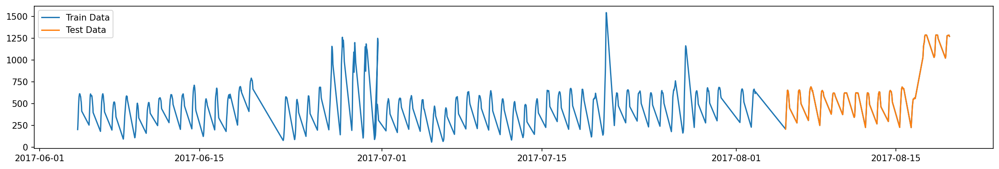

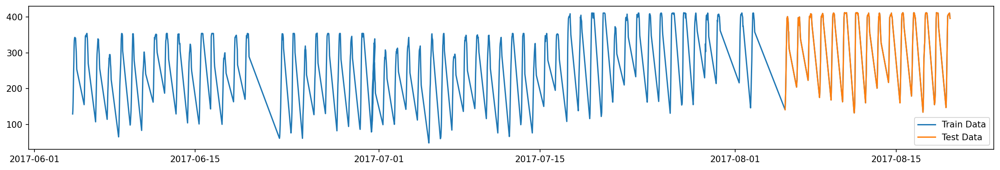

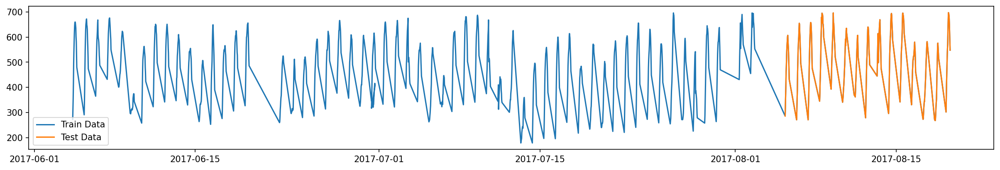

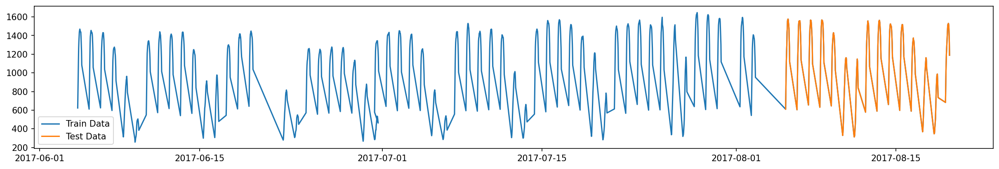

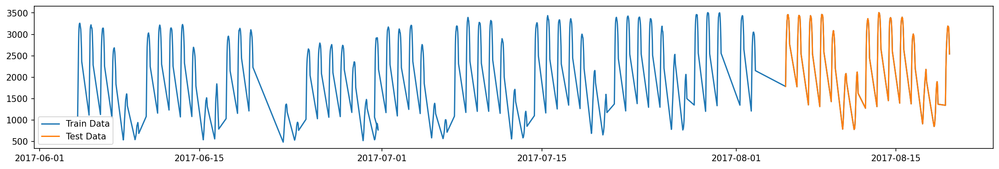

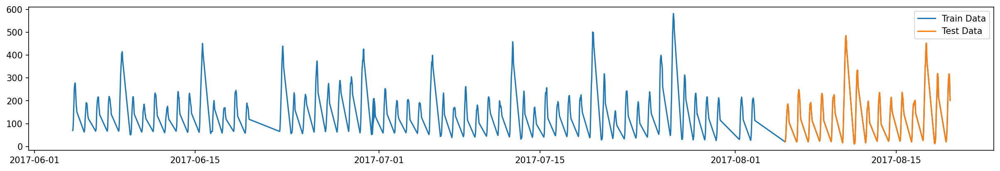

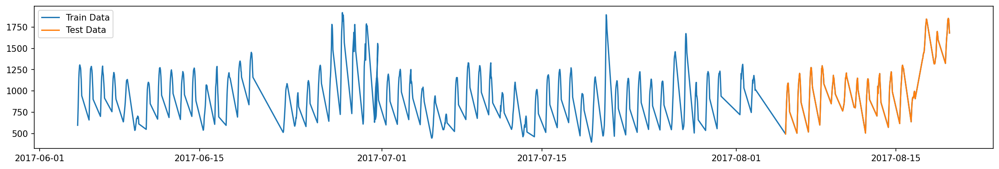

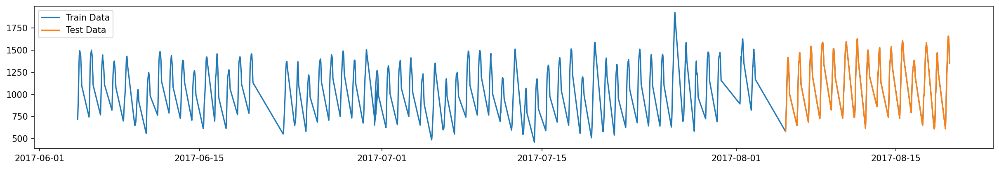

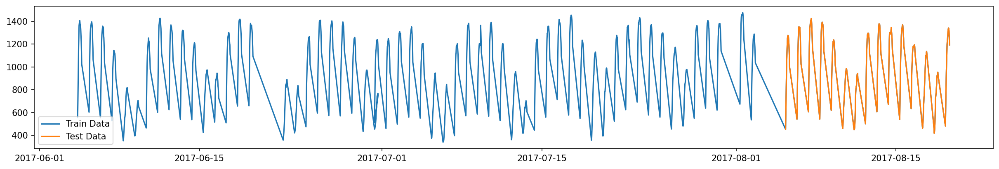

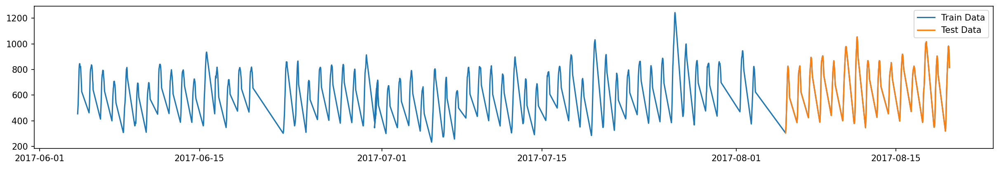

In [11]:
for i in range(10):
    plot_graph(i)

After observing the graphs, it seems there are missing dates for each munipalicity.

In [12]:
df[(df['timestamp'] <= '2017-06-22 7:00:00') & (df['timestamp'] > '2017-06-19 17')]

,timestamp,municipality_id,usage,total_capacity


In [13]:
df[(df['timestamp'] <= '2017-08-05 8:00:00') & (df['timestamp'] >= '2017-08-02 17:00:00')]

,timestamp,municipality_id,usage,total_capacity


Total capacity does not change and it is different for each municipality

In [14]:
def total_capacity_check(m_id):
    print(df[df['municipality_id'] == m_id]['total_capacity'].unique())

In [15]:
for i in range(10):
    total_capacity_check(i)

[2813]
[397]
[697]
[1930]
[3893]
[587]
[3113]
[2019]
[2947]
[1332]


### Splitting and Filling 

In [16]:
def seperate_muni(m_id):
    
    #Indexing timestamp
    df_ = df[df['municipality_id'] == m_id]
    df_ = df_.set_index('timestamp')
    df_ = df_.resample("H").max()
    
    #Filling Missing Values
    tc = df_.total_capacity[0]
    mi = df_.municipality_id[0]
    df_.total_capacity = df_.total_capacity.fillna(value = tc)
    df_.municipality_id = df_.municipality_id.fillna(value = mi)
    df_.usage = df_.usage.fillna(method = 'bfill')
    df_['usage'] = df_['usage'].astype(int)
    
    #Weekend Feature
    df_['date'] = df_.index.get_level_values(0).date
    df_['date'] = pd.to_datetime(df_['date'])
    df_['dow'] = df_['date'].dt.day_of_week
    df_['dow'] = df_['dow'].replace(to_replace=[0,1,2,3,4,5,6],
                                  value=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    df_ = df_.join(pd.get_dummies(df_['dow'],dtype=int))
    
    #Dropping columns
    df_ = df_.drop(['municipality_id','total_capacity','date'], axis=1)
    
    return df_

In [17]:
df_0 = seperate_muni(0)
df_1 = seperate_muni(1)
df_2 = seperate_muni(2)
df_3 = seperate_muni(3)
df_4 = seperate_muni(4)
df_5 = seperate_muni(5)
df_6 = seperate_muni(6)
df_7 = seperate_muni(7)
df_8 = seperate_muni(8)
df_9 = seperate_muni(9)

- Before test part 3 days are missing. To prevent data leakage and better training results I decided to exluce that part from traning.
- Basically I will train with the orange data shown below and forecast future. Prediction length equals to blue + green data length.
- Then test data will be compared to the predictions data's last part.

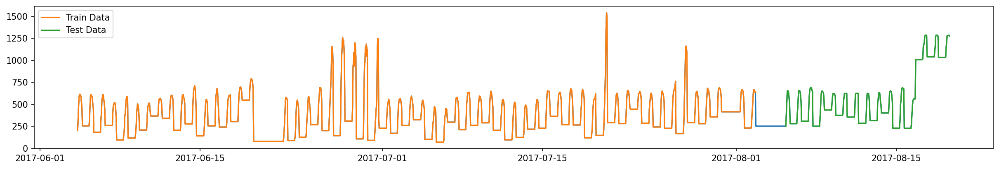

In [18]:
plt.figure(figsize=(20,3),dpi=150)
plt.plot(df_0.usage)
plt.plot(df_0[df_0.index.get_level_values(0) <= '2017-08-02 16:00:00']['usage'],label='Train Data')
plt.plot(df_0[df_0.index.get_level_values(0) >= '2017-08-05 8:00:00']['usage'],label='Test Data')
plt.legend()
plt.show()

In [19]:
test_size = len(df_9[df_9.index.get_level_values(0) >= '2017-08-05 8:00:00'])

In [20]:
train_size = len(df_9[df_9.index.get_level_values(0) <= '2017-08-02 16:00:00'])

In [21]:
pred_size = len(df_9[df_9.index.get_level_values(0) > '2017-08-02 16:00:00'])

In [22]:
df_0_train = df_0[:train_size]
df_0_test = df_0[-test_size:]

df_1_train = df_1[:train_size]
df_1_test = df_1[-test_size:]

df_2_train = df_2[:train_size]
df_2_test = df_2[-test_size:]

df_3_train = df_3[:train_size]
df_3_test = df_3[-test_size:]

df_4_train = df_4[:train_size]
df_4_test = df_4[-test_size:]

df_5_train = df_5[:train_size]
df_5_test = df_5[-test_size:]

df_6_train = df_6[:train_size]
df_6_test = df_6[-test_size:]

df_7_train = df_7[:train_size]
df_7_test = df_7[-test_size:]

df_8_train = df_8[:train_size]
df_8_test = df_8[-test_size:]

df_9_train = df_9[:train_size]
df_9_test = df_9[-test_size:]

## Forecasting

In [102]:
import time
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tools.eval_measures import rmse
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np

In [24]:
def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

### Holt Winters

Municipality 0

In [25]:
adf_test(df_0_train['usage'],'Municipality 0')

Augmented Dickey-Fuller Test: Municipality 0
ADF test statistic        -4.312401
p-value                    0.000423
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.04777264595031738
Prediction time: 0.005159854888916016
Root Mean Squared Error: 304.6004282415801
Test Data Std: 313.2117883606052
Test Data Mean: 557.4347826086956


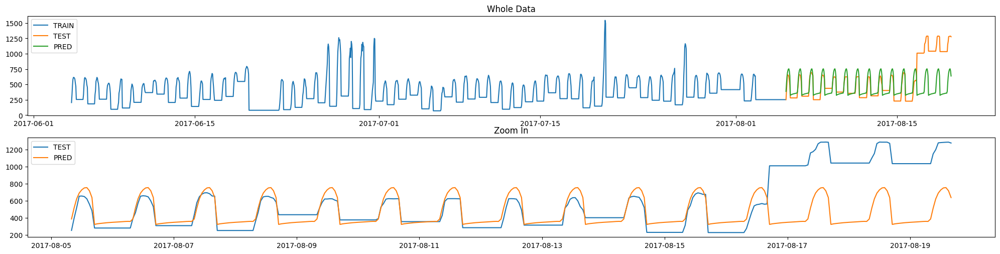

In [26]:
#TRAIN
t0 = time.time()
model_0_ES = ExponentialSmoothing(df_0_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_0_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_0_ES_preds = model_0_ES.forecast(pred_size)
model_0_ES_pred_time = time.time()-t0

#EVALUATION
model_0_ES_RMSE = rmse(df_0_test['usage'],model_0_ES_preds[-test_size:])
df_0_test_std = df_0_test['usage'].std()
df_0_test_mean = df_0_test['usage'].mean()

#PRINT
print("Training time:", model_0_ES_train_time)
print("Prediction time:", model_0_ES_pred_time)
print("Root Mean Squared Error:", model_0_ES_RMSE)
print("Test Data Std:", df_0_test_std)
print("Test Data Mean:", df_0_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_0['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_0_test['usage'],label="TEST")
axs[0].plot(model_0_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_0_test['usage'],label="TEST")
axs[1].plot(model_0_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 1

In [27]:
adf_test(df_1_train['usage'],'Municipality 1')

Augmented Dickey-Fuller Test: Municipality 1
ADF test statistic        -3.784430
p-value                    0.003071
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.034886837005615234
Prediction time: 0.005053043365478516
Root Mean Squared Error: 31.735671847213332
Test Data Std: 99.4846107811236
Test Data Mean: 252.13623188405796


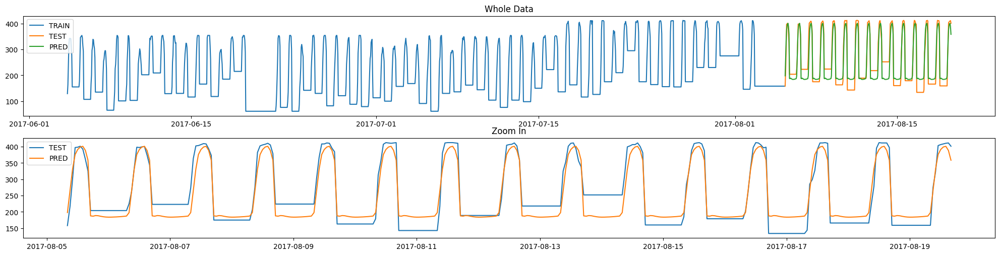

In [28]:
#TRAIN
t0 = time.time()
model_1_ES = ExponentialSmoothing(df_1_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_1_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_1_ES_preds = model_1_ES.forecast(pred_size)
model_1_ES_pred_time = time.time()-t0

#EVALUATION
model_1_ES_RMSE = rmse(df_1_test['usage'],model_1_ES_preds[-test_size:])
df_1_test_std = df_1_test['usage'].std()
df_1_test_mean = df_1_test['usage'].mean()

#PRINT
print("Training time:", model_1_ES_train_time)
print("Prediction time:", model_1_ES_pred_time)
print("Root Mean Squared Error:", model_1_ES_RMSE)
print("Test Data Std:", df_1_test_std)
print("Test Data Mean:", df_1_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_1['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_1_test['usage'],label="TEST")
axs[0].plot(model_1_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_1_test['usage'],label="TEST")
axs[1].plot(model_1_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 2

In [29]:
adf_test(df_2_train['usage'],'Municipality 2')

Augmented Dickey-Fuller Test: Municipality 2
ADF test statistic        -3.193840
p-value                    0.020344
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.0281827449798584
Prediction time: 0.006344318389892578
Root Mean Squared Error: 77.28161353591122
Test Data Std: 126.07849668863679
Test Data Mean: 415.94202898550725


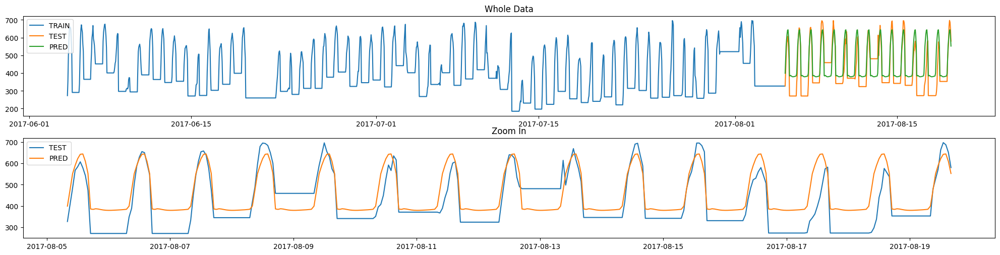

In [30]:
#TRAIN
t0 = time.time()
model_2_ES = ExponentialSmoothing(df_2_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_2_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_2_ES_preds = model_2_ES.forecast(pred_size)
model_2_ES_pred_time = time.time()-t0

#EVALUATION
model_2_ES_RMSE = rmse(df_2_test['usage'],model_2_ES_preds[-test_size:])
df_2_test_std = df_2_test['usage'].std()
df_2_test_mean = df_2_test['usage'].mean()

#PRINT
print("Training time:", model_2_ES_train_time)
print("Prediction time:", model_2_ES_pred_time)
print("Root Mean Squared Error:", model_2_ES_RMSE)
print("Test Data Std:", df_2_test_std)
print("Test Data Mean:", df_2_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_2['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_2_test['usage'],label="TEST")
axs[0].plot(model_2_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_2_test['usage'],label="TEST")
axs[1].plot(model_2_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 3

In [31]:
adf_test(df_3_train['usage'],'Municipality 3')

Augmented Dickey-Fuller Test: Municipality 3
ADF test statistic        -5.252552
p-value                    0.000007
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.08694815635681152
Prediction time: 0.00565338134765625
Root Mean Squared Error: 179.34759598187765
Test Data Std: 382.31314351380087
Test Data Mean: 840.8202898550725


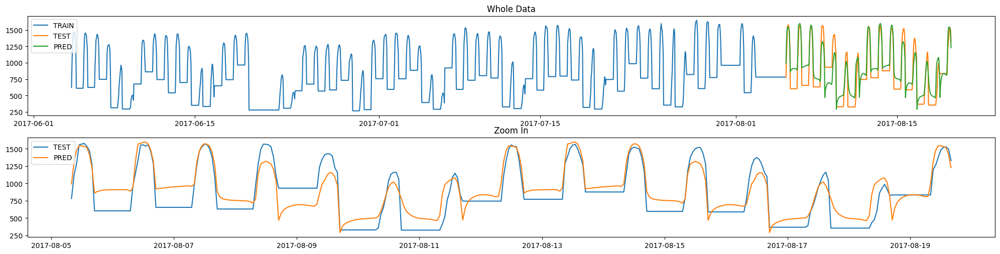

In [32]:
#TRAIN
t0 = time.time()
model_3_ES = ExponentialSmoothing(df_3_train['usage'],
                                seasonal='add',
                               seasonal_periods=7*24).fit()
model_3_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_3_ES_preds = model_3_ES.forecast(pred_size)
model_3_ES_pred_time = time.time()-t0

#EVALUATION
model_3_ES_RMSE = rmse(df_3_test['usage'],model_3_ES_preds[-test_size:])
df_3_test_std = df_3_test['usage'].std()
df_3_test_mean = df_3_test['usage'].mean()

#PRINT
print("Training time:", model_3_ES_train_time)
print("Prediction time:", model_3_ES_pred_time)
print("Root Mean Squared Error:", model_3_ES_RMSE)
print("Test Data Std:", df_3_test_std)
print("Test Data Mean:", df_3_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_3['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_3_test['usage'],label="TEST")
axs[0].plot(model_3_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_3_test['usage'],label="TEST")
axs[1].plot(model_3_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 4

In [33]:
adf_test(df_4_train['usage'],'Municipality 4')

Augmented Dickey-Fuller Test: Municipality 4
ADF test statistic        -5.185270
p-value                    0.000009
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.05488896369934082
Prediction time: 0.005578517913818359
Root Mean Squared Error: 484.25176982364854
Test Data Std: 824.8425395587469
Test Data Mean: 1881.7652173913043


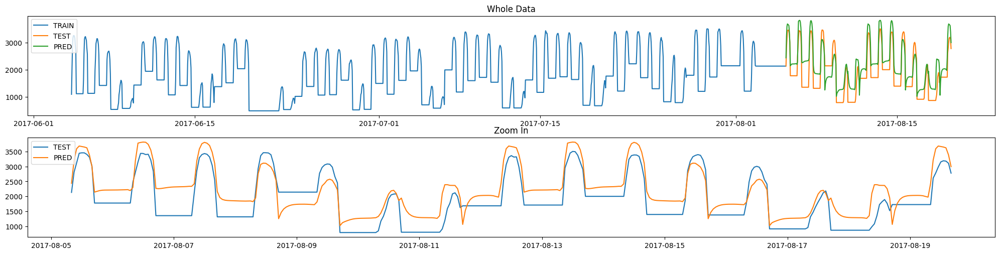

In [34]:
#TRAIN
t0 = time.time()
model_4_ES = ExponentialSmoothing(df_4_train['usage'],
                                seasonal='add',
                               seasonal_periods=7*24).fit()
model_4_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_4_ES_preds = model_4_ES.forecast(pred_size)
model_4_ES_pred_time = time.time()-t0

#EVALUATION
model_4_ES_RMSE = rmse(df_4_test['usage'],model_4_ES_preds[-test_size:])
df_4_test_std = df_4_test['usage'].std()
df_4_test_mean = df_4_test['usage'].mean()

#PRINT
print("Training time:", model_4_ES_train_time)
print("Prediction time:", model_4_ES_pred_time)
print("Root Mean Squared Error:", model_4_ES_RMSE)
print("Test Data Std:", df_4_test_std)
print("Test Data Mean:", df_4_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_4['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_4_test['usage'],label="TEST")
axs[0].plot(model_4_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_4_test['usage'],label="TEST")
axs[1].plot(model_4_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 5

In [35]:
adf_test(df_5_train['usage'],'Municipality 5')

Augmented Dickey-Fuller Test: Municipality 5
ADF test statistic     -6.443842e+00
p-value                 1.583747e-08
# lags used             2.400000e+01
# observations          1.401000e+03
critical value (1%)    -3.435026e+00
critical value (5%)    -2.863605e+00
critical value (10%)   -2.567870e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.03006720542907715
Prediction time: 0.0054967403411865234
Root Mean Squared Error: 66.28682750964875
Test Data Std: 100.76893299236936
Test Data Mean: 83.36521739130434


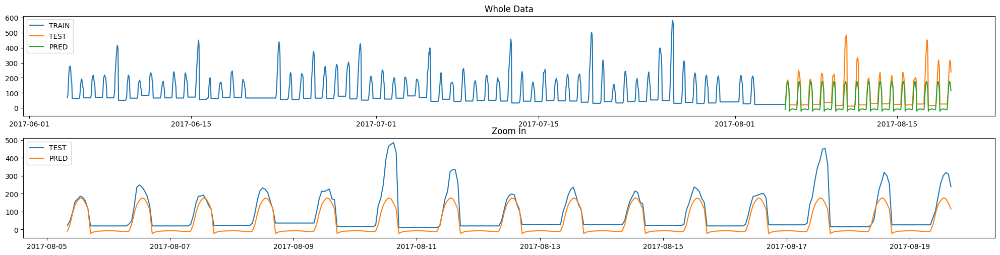

In [36]:
#TRAIN
t0 = time.time()
model_5_ES = ExponentialSmoothing(df_5_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_5_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_5_ES_preds = model_5_ES.forecast(pred_size)
model_5_ES_pred_time = time.time()-t0

#EVALUATION
model_5_ES_RMSE = rmse(df_5_test['usage'],model_5_ES_preds[-test_size:])
df_5_test_std = df_5_test['usage'].std()
df_5_test_mean = df_5_test['usage'].mean()

#PRINT
print("Training time:", model_5_ES_train_time)
print("Prediction time:", model_5_ES_pred_time)
print("Root Mean Squared Error:", model_5_ES_RMSE)
print("Test Data Std:", df_5_test_std)
print("Test Data Mean:", df_5_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_5['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_5_test['usage'],label="TEST")
axs[0].plot(model_5_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_5_test['usage'],label="TEST")
axs[1].plot(model_5_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 6

In [37]:
adf_test(df_6_train['usage'],'Municipality 6')

Augmented Dickey-Fuller Test: Municipality 6
ADF test statistic        -4.040187
p-value                    0.001214
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.03443765640258789
Prediction time: 0.005384922027587891
Root Mean Squared Error: 307.60978610938565
Test Data Std: 334.3384319939754
Test Data Mean: 947.2260869565217


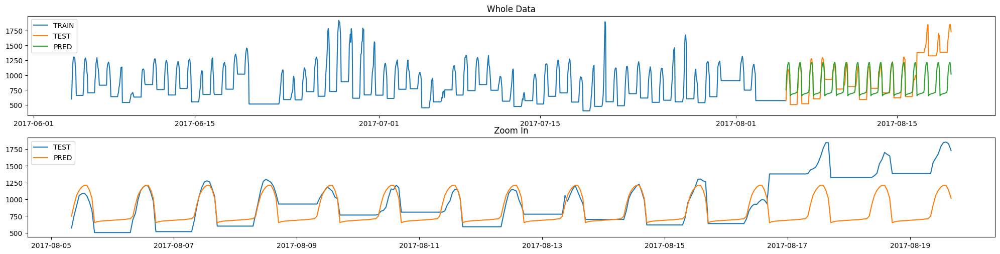

In [38]:
#TRAIN
t0 = time.time()
model_6_ES = ExponentialSmoothing(df_6_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_6_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_6_ES_preds = model_6_ES.forecast(pred_size)
model_6_ES_pred_time = time.time()-t0

#EVALUATION
model_6_ES_RMSE = rmse(df_6_test['usage'],model_6_ES_preds[-test_size:])
df_6_test_std = df_6_test['usage'].std()
df_6_test_mean = df_6_test['usage'].mean()

#PRINT
print("Training time:", model_6_ES_train_time)
print("Prediction time:", model_6_ES_pred_time)
print("Root Mean Squared Error:", model_6_ES_RMSE)
print("Test Data Std:", df_6_test_std)
print("Test Data Mean:", df_6_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_6['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_6_test['usage'],label="TEST")
axs[0].plot(model_6_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_6_test['usage'],label="TEST")
axs[1].plot(model_6_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 7

In [39]:
adf_test(df_7_train['usage'],'Municipality 7')

Augmented Dickey-Fuller Test: Municipality 7
ADF test statistic        -4.287209
p-value                    0.000467
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.04335141181945801
Prediction time: 0.01101827621459961
Root Mean Squared Error: 124.48235188243605
Test Data Std: 313.7489177950954
Test Data Mean: 950.9826086956522


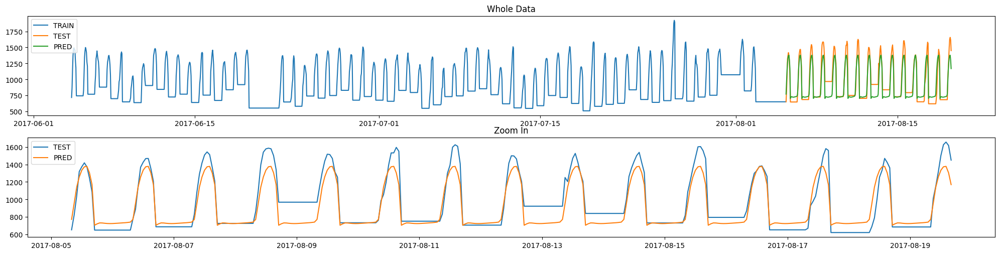

In [40]:
#TRAIN
t0 = time.time()
model_7_ES = ExponentialSmoothing(df_7_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_7_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_7_ES_preds = model_7_ES.forecast(pred_size)
model_7_ES_pred_time = time.time()-t0

#EVALUATION
model_7_ES_RMSE = rmse(df_7_test['usage'],model_7_ES_preds[-test_size:])
df_7_test_std = df_7_test['usage'].std()
df_7_test_mean = df_7_test['usage'].mean()

#PRINT
print("Training time:", model_7_ES_train_time)
print("Prediction time:", model_7_ES_pred_time)
print("Root Mean Squared Error:", model_7_ES_RMSE)
print("Test Data Std:", df_7_test_std)
print("Test Data Mean:", df_7_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_7['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_7_test['usage'],label="TEST")
axs[0].plot(model_7_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_7_test['usage'],label="TEST")
axs[1].plot(model_7_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 8

In [41]:
adf_test(df_8_train['usage'],'Municipality 8')

Augmented Dickey-Fuller Test: Municipality 8
ADF test statistic        -5.554453
p-value                    0.000002
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.03238058090209961
Prediction time: 0.0053327083587646484
Root Mean Squared Error: 158.01382237024544
Test Data Std: 300.19868204639573
Test Data Mean: 784.5449275362319


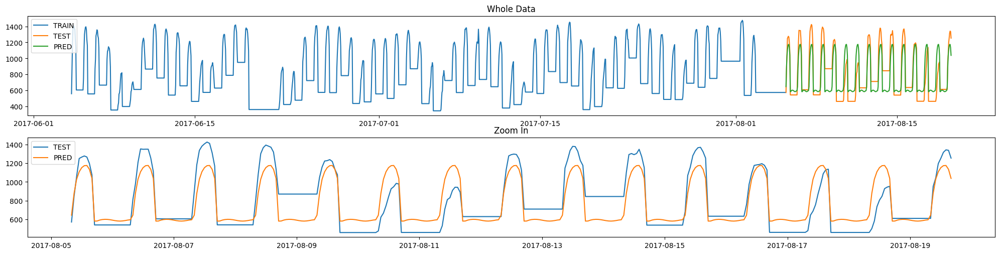

In [42]:
#TRAIN
t0 = time.time()
model_8_ES = ExponentialSmoothing(df_8_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_8_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_8_ES_preds = model_8_ES.forecast(pred_size)
model_8_ES_pred_time = time.time()-t0

#EVALUATION
model_8_ES_RMSE = rmse(df_8_test['usage'],model_8_ES_preds[-test_size:])
df_8_test_std = df_8_test['usage'].std()
df_8_test_mean = df_8_test['usage'].mean()

#PRINT
print("Training time:", model_8_ES_train_time)
print("Prediction time:", model_8_ES_pred_time)
print("Root Mean Squared Error:", model_8_ES_RMSE)
print("Test Data Std:", df_8_test_std)
print("Test Data Mean:", df_8_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_8['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_8_test['usage'],label="TEST")
axs[0].plot(model_8_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_8_test['usage'],label="TEST")
axs[1].plot(model_8_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 9

In [43]:
adf_test(df_9_train['usage'],'Municipality 9')

Augmented Dickey-Fuller Test: Municipality 9
ADF test statistic        -4.925915
p-value                    0.000031
# lags used               24.000000
# observations          1401.000000
critical value (1%)       -3.435026
critical value (5%)       -2.863605
critical value (10%)      -2.567870
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 0.032460927963256836
Prediction time: 0.0059168338775634766
Root Mean Squared Error: 107.6009106679597
Test Data Std: 197.15611407329294
Test Data Mean: 544.5478260869565


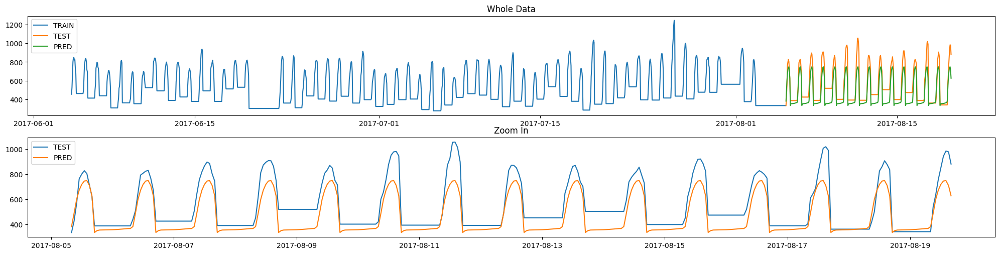

In [44]:
#TRAIN
t0 = time.time()
model_9_ES = ExponentialSmoothing(df_9_train['usage'],
                                seasonal='add',
                               seasonal_periods=24).fit()
model_9_ES_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_9_ES_preds = model_9_ES.forecast(pred_size)
model_9_ES_pred_time = time.time()-t0

#EVALUATION
model_9_ES_RMSE = rmse(df_9_test['usage'],model_9_ES_preds[-test_size:])
df_9_test_std = df_9_test['usage'].std()
df_9_test_mean = df_9_test['usage'].mean()

#PRINT
print("Training time:", model_9_ES_train_time)
print("Prediction time:", model_9_ES_pred_time)
print("Root Mean Squared Error:", model_9_ES_RMSE)
print("Test Data Std:", df_9_test_std)
print("Test Data Mean:", df_9_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_9['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_9_test['usage'],label="TEST")
axs[0].plot(model_9_ES_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_9_test['usage'],label="TEST")
axs[1].plot(model_9_ES_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

### ARIMA

Municipalty 0

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


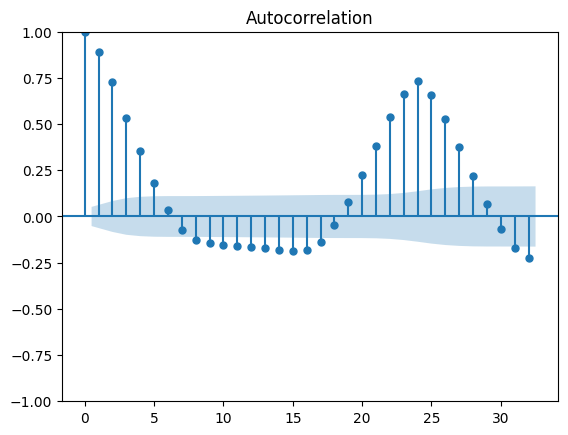

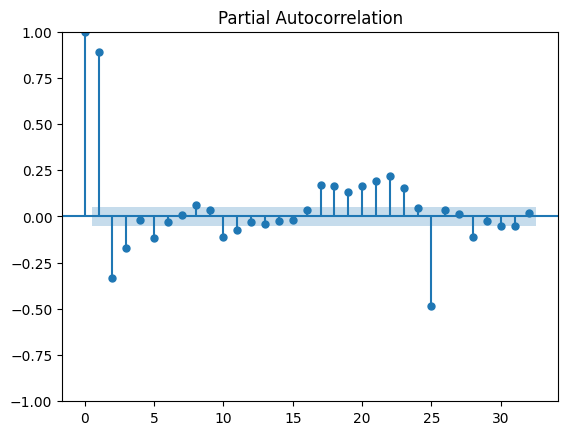

In [ ]:
plot_acf(df_0_train['usage']);
plot_pacf(df_0_train['usage']);

Training time: 0.04777264595031738
Prediction time: 0.01552438735961914
Root Mean Squared Error: 304.6004282415801
Test Data Std: 313.2117883606052
Test Data Mean: 557.4347826086956


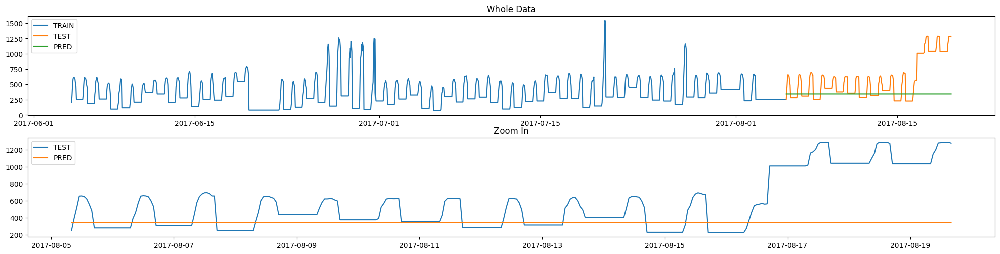

In [152]:
#TRAIN
model_0_ARIMA = ARIMA(df_0_train['usage'], order=(2,0,6))
t0 = time.time()
results_0_ARIMA = model_0_ARIMA.fit()
model_0_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_0_ARIMA_preds = results_0_ARIMA.predict(train_size,train_size+pred_size-1)
model_0_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_0_ARIMA_RMSE = rmse(df_0_test['usage'],model_0_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_0_ES_train_time)
print("Prediction time:", model_0_ES_pred_time)
print("Root Mean Squared Error:", model_0_ES_RMSE)
print("Test Data Std:", df_0_test_std)
print("Test Data Mean:", df_0_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_0['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_0_test['usage'],label="TEST")
axs[0].plot(model_0_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_0_test['usage'],label="TEST")
axs[1].plot(model_0_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 1

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


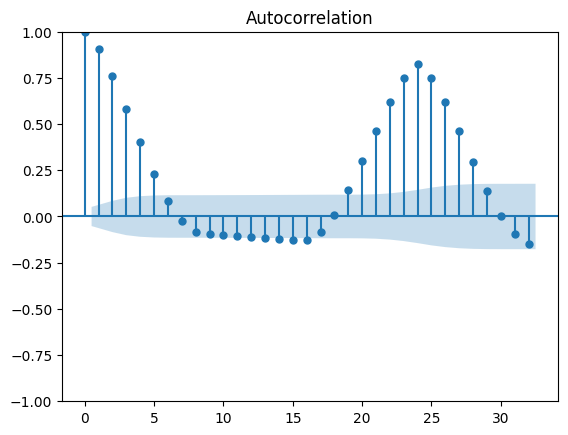

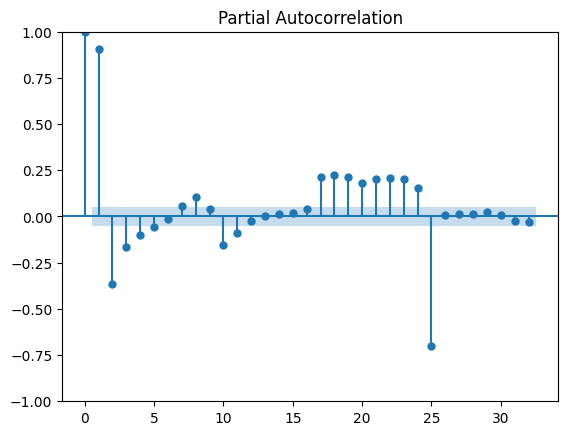

In [ ]:
plot_acf(df_1_train['usage']);
plot_pacf(df_1_train['usage']);

Training time: 0.034886837005615234
Prediction time: 0.018580198287963867
Root Mean Squared Error: 31.735671847213332
Test Data Std: 99.4846107811236
Test Data Mean: 252.13623188405796


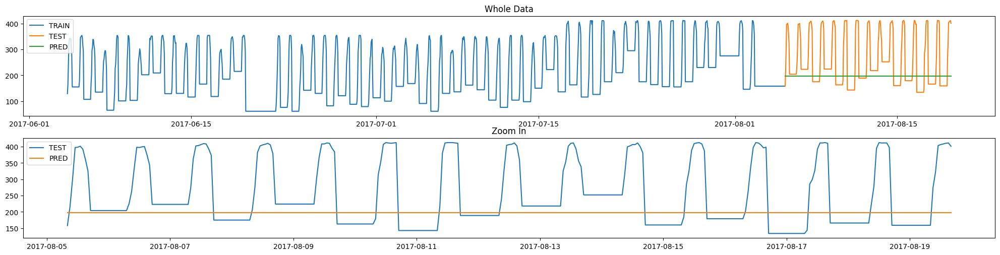

In [153]:
#TRAIN
model_1_ARIMA = ARIMA(df_1_train['usage'], order=(2,0,6))
t0 = time.time()
results_1_ARIMA = model_1_ARIMA.fit()
model_1_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_1_ARIMA_preds = results_1_ARIMA.predict(train_size,train_size+pred_size-1)
model_1_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_1_ARIMA_RMSE = rmse(df_1_test['usage'],model_1_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_1_ES_train_time)
print("Prediction time:", model_1_ES_pred_time)
print("Root Mean Squared Error:", model_1_ES_RMSE)
print("Test Data Std:", df_1_test_std)
print("Test Data Mean:", df_1_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_1['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_1_test['usage'],label="TEST")
axs[0].plot(model_1_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_1_test['usage'],label="TEST")
axs[1].plot(model_1_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 2

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


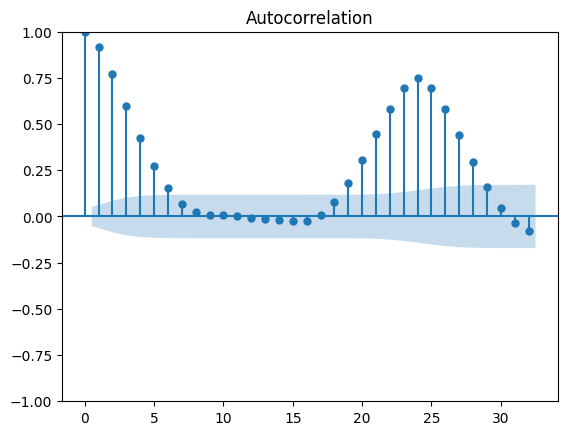

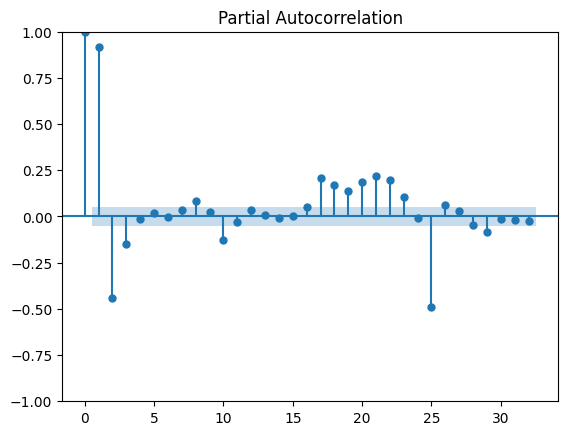

In [ ]:
plot_acf(df_2_train['usage']);
plot_pacf(df_2_train['usage']);

Training time: 0.0281827449798584
Prediction time: 0.015862703323364258
Root Mean Squared Error: 77.28161353591122
Test Data Std: 126.07849668863679
Test Data Mean: 415.94202898550725


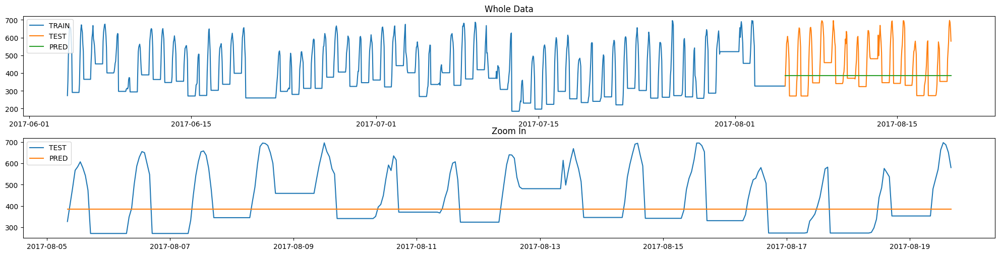

In [154]:
#TRAIN
model_2_ARIMA = ARIMA(df_2_train['usage'], order=(2,0,6))
t0 = time.time()
results_2_ARIMA = model_2_ARIMA.fit()
model_2_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_2_ARIMA_preds = results_2_ARIMA.predict(train_size,train_size+pred_size-1)
model_2_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_2_ARIMA_RMSE = rmse(df_2_test['usage'],model_2_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_2_ES_train_time)
print("Prediction time:", model_2_ES_pred_time)
print("Root Mean Squared Error:", model_2_ES_RMSE)
print("Test Data Std:", df_2_test_std)
print("Test Data Mean:", df_2_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_2['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_2_test['usage'],label="TEST")
axs[0].plot(model_2_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_2_test['usage'],label="TEST")
axs[1].plot(model_2_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 3

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


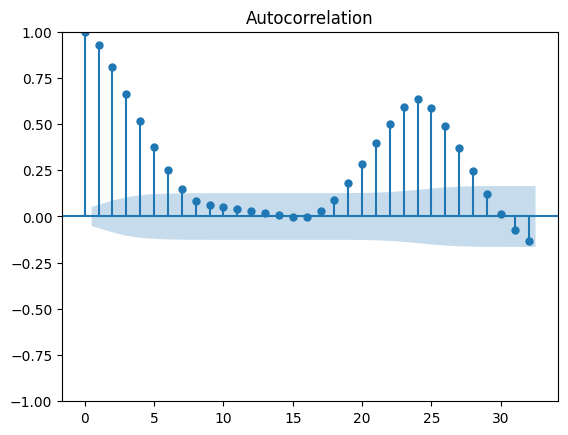

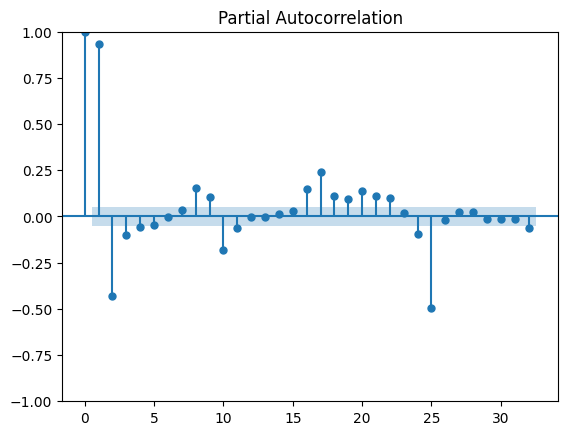

In [ ]:
plot_acf(df_3_train['usage']);
plot_pacf(df_3_train['usage']);

Training time: 0.08694815635681152
Prediction time: 0.01573324203491211
Root Mean Squared Error: 179.34759598187765
Test Data Std: 382.31314351380087
Test Data Mean: 840.8202898550725


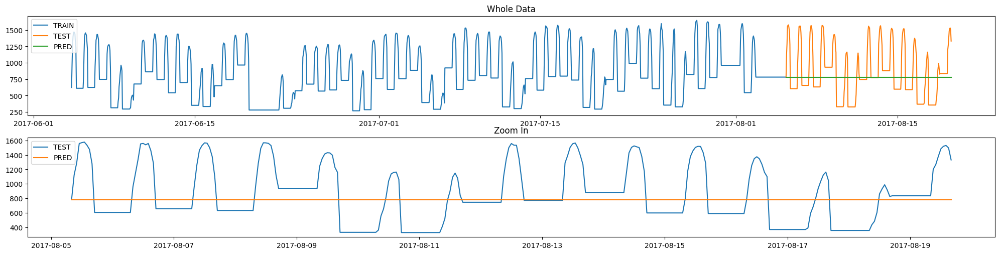

In [155]:
#TRAIN
model_3_ARIMA = ARIMA(df_3_train['usage'], order=(2,0,7))
t0 = time.time()
results_3_ARIMA = model_3_ARIMA.fit()
model_3_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_3_ARIMA_preds = results_3_ARIMA.predict(train_size,train_size+pred_size-1)
model_3_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_3_ARIMA_RMSE = rmse(df_3_test['usage'],model_3_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_3_ES_train_time)
print("Prediction time:", model_3_ES_pred_time)
print("Root Mean Squared Error:", model_3_ES_RMSE)
print("Test Data Std:", df_3_test_std)
print("Test Data Mean:", df_3_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_3['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_3_test['usage'],label="TEST")
axs[0].plot(model_3_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_3_test['usage'],label="TEST")
axs[1].plot(model_3_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 4

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


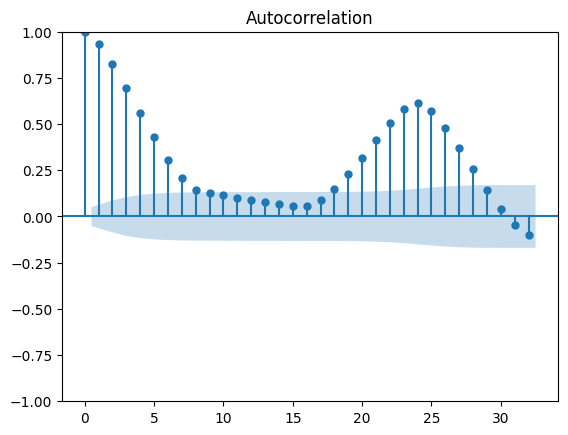

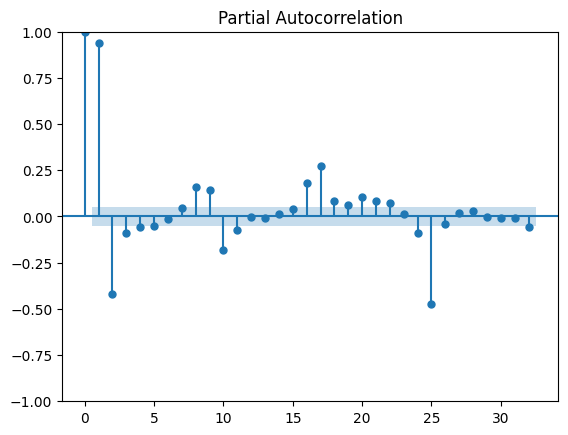

In [ ]:
plot_acf(df_4_train['usage']);
plot_pacf(df_4_train['usage']);

Training time: 0.05488896369934082
Prediction time: 0.0171353816986084
Root Mean Squared Error: 484.25176982364854
Test Data Std: 824.8425395587469
Test Data Mean: 1881.7652173913043


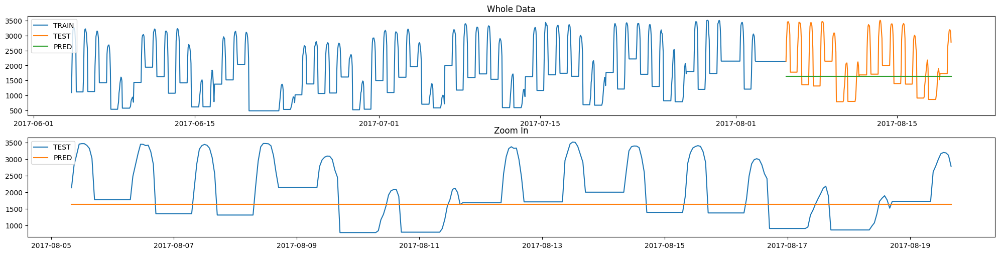

In [156]:
#TRAIN
model_4_ARIMA = ARIMA(df_4_train['usage'], order=(2,0,7))
t0 = time.time()
results_4_ARIMA = model_4_ARIMA.fit()
model_4_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_4_ARIMA_preds = results_4_ARIMA.predict(train_size,train_size+pred_size-1)
model_4_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_4_ARIMA_RMSE = rmse(df_4_test['usage'],model_4_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_4_ES_train_time)
print("Prediction time:", model_4_ES_pred_time)
print("Root Mean Squared Error:", model_4_ES_RMSE)
print("Test Data Std:", df_4_test_std)
print("Test Data Mean:", df_4_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_4['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_4_test['usage'],label="TEST")
axs[0].plot(model_4_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_4_test['usage'],label="TEST")
axs[1].plot(model_4_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 5

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


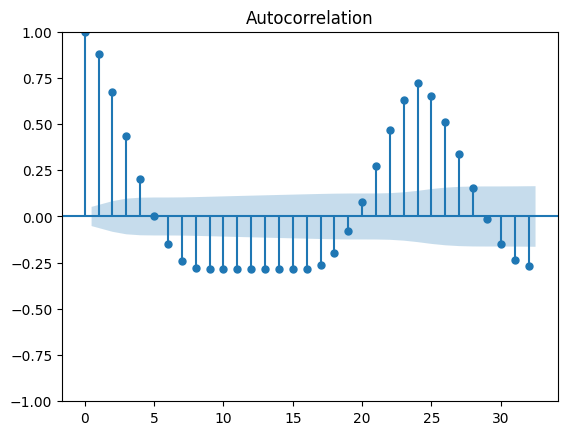

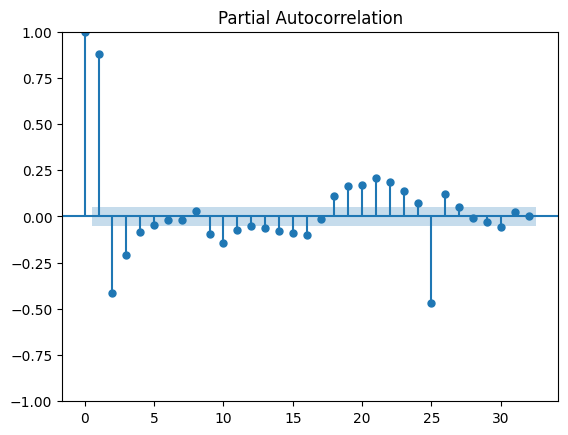

In [ ]:
plot_acf(df_5_train['usage']);
plot_pacf(df_5_train['usage']);

Training time: 0.03006720542907715
Prediction time: 0.044644832611083984
Root Mean Squared Error: 66.28682750964875
Test Data Std: 100.76893299236936
Test Data Mean: 83.36521739130434


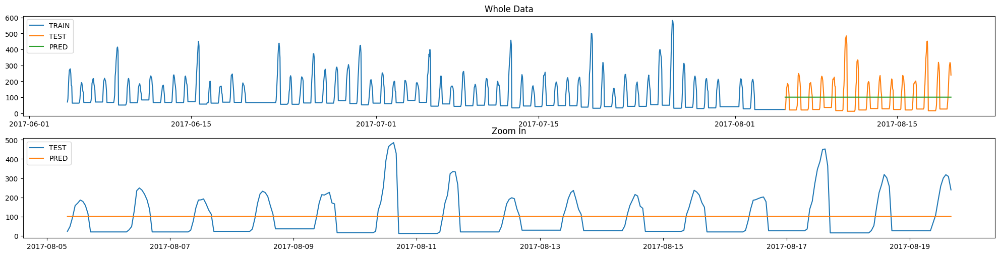

In [157]:
#TRAIN
model_5_ARIMA = ARIMA(df_5_train['usage'], order=(2,0,5))
t0 = time.time()
results_5_ARIMA = model_5_ARIMA.fit()
model_5_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_5_ARIMA_preds = results_5_ARIMA.predict(train_size,train_size+pred_size-1)
model_5_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_5_ARIMA_RMSE = rmse(df_5_test['usage'],model_5_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_5_ES_train_time)
print("Prediction time:", model_5_ES_pred_time)
print("Root Mean Squared Error:", model_5_ES_RMSE)
print("Test Data Std:", df_5_test_std)
print("Test Data Mean:", df_5_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_5['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_5_test['usage'],label="TEST")
axs[0].plot(model_5_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_5_test['usage'],label="TEST")
axs[1].plot(model_5_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 6

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


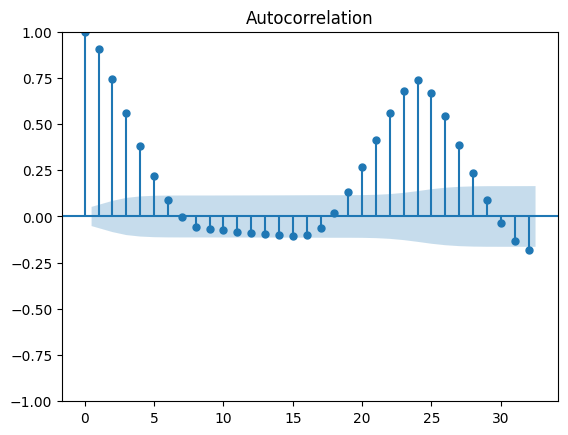

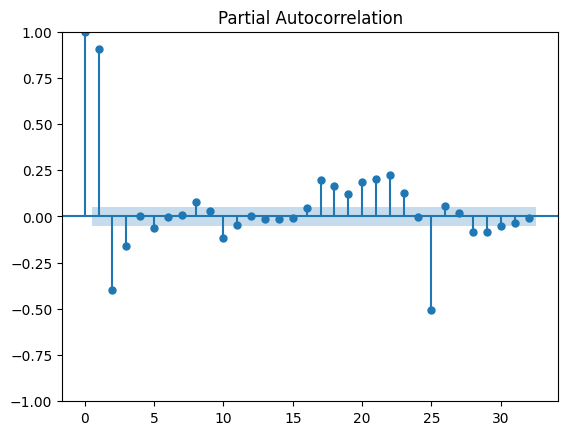

In [ ]:
plot_acf(df_6_train['usage']);
plot_pacf(df_6_train['usage']);

Training time: 0.03443765640258789
Prediction time: 0.015272855758666992
Root Mean Squared Error: 307.60978610938565
Test Data Std: 334.3384319939754
Test Data Mean: 947.2260869565217


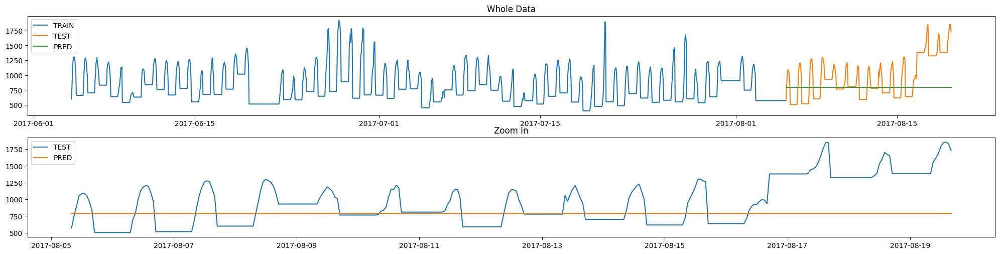

In [158]:
#TRAIN
model_6_ARIMA = ARIMA(df_6_train['usage'], order=(2,0,6))
t0 = time.time()
results_6_ARIMA = model_6_ARIMA.fit()
model_6_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_6_ARIMA_preds = results_6_ARIMA.predict(train_size,train_size+pred_size-1)
model_6_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_6_ARIMA_RMSE = rmse(df_6_test['usage'],model_6_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_6_ES_train_time)
print("Prediction time:", model_6_ES_pred_time)
print("Root Mean Squared Error:", model_6_ES_RMSE)
print("Test Data Std:", df_6_test_std)
print("Test Data Mean:", df_6_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_6['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_6_test['usage'],label="TEST")
axs[0].plot(model_6_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_6_test['usage'],label="TEST")
axs[1].plot(model_6_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 7

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


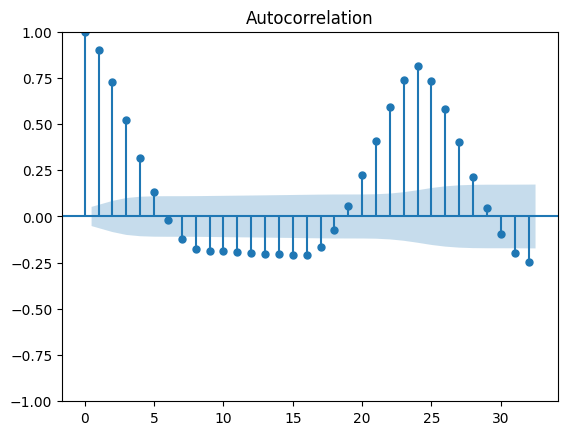

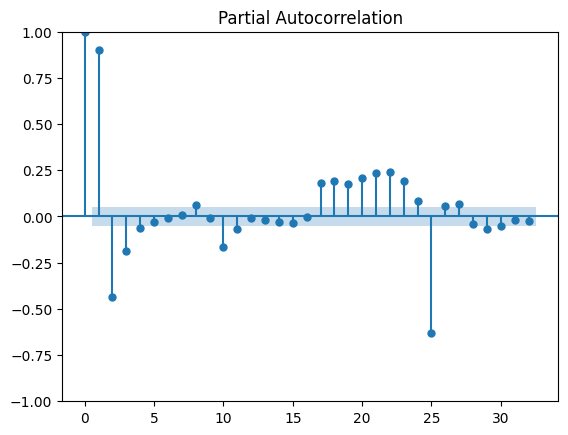

In [ ]:
plot_acf(df_7_train['usage']);
plot_pacf(df_7_train['usage']);

Training time: 0.04335141181945801
Prediction time: 0.015297651290893555
Root Mean Squared Error: 124.48235188243605
Test Data Std: 313.7489177950954
Test Data Mean: 950.9826086956522


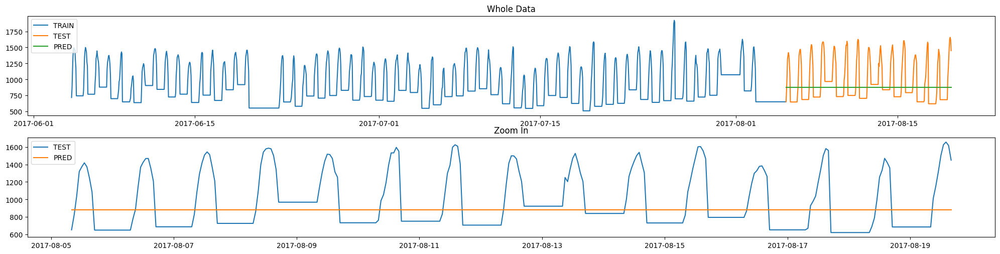

In [159]:
#TRAIN
model_7_ARIMA = ARIMA(df_7_train['usage'], order=(2,0,5))
t0 = time.time()
results_7_ARIMA = model_7_ARIMA.fit()
model_7_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_7_ARIMA_preds = results_7_ARIMA.predict(train_size,train_size+pred_size-1)
model_7_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_7_ARIMA_RMSE = rmse(df_7_test['usage'],model_7_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_7_ES_train_time)
print("Prediction time:", model_7_ES_pred_time)
print("Root Mean Squared Error:", model_7_ES_RMSE)
print("Test Data Std:", df_7_test_std)
print("Test Data Mean:", df_7_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_7['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_7_test['usage'],label="TEST")
axs[0].plot(model_7_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_7_test['usage'],label="TEST")
axs[1].plot(model_7_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 8

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


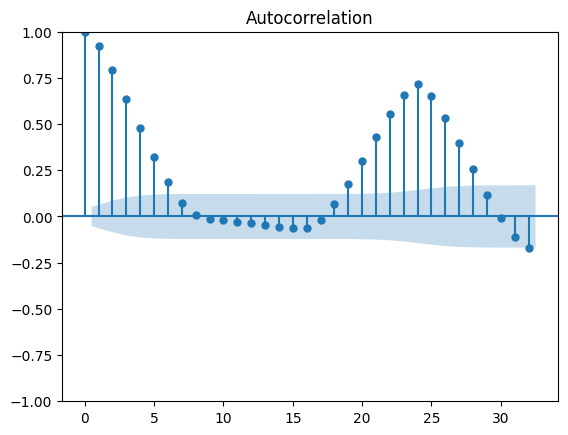

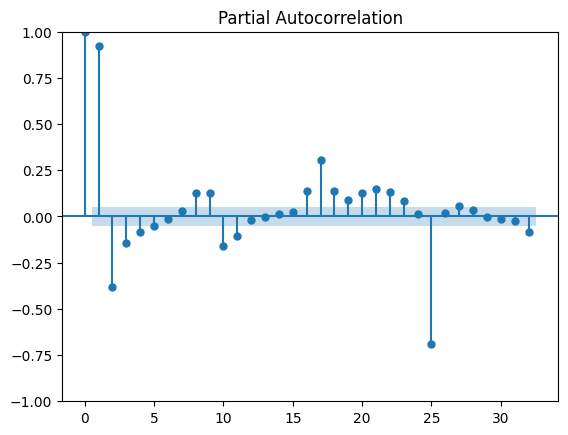

In [ ]:
plot_acf(df_8_train['usage']);
plot_pacf(df_8_train['usage']);

Training time: 0.03238058090209961
Prediction time: 0.05152010917663574
Root Mean Squared Error: 158.01382237024544
Test Data Std: 300.19868204639573
Test Data Mean: 784.5449275362319


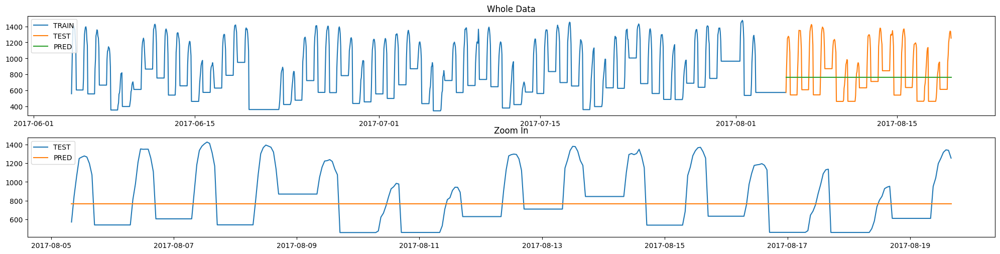

In [160]:
#TRAIN
model_8_ARIMA = ARIMA(df_8_train['usage'], order=(2,0,6))
t0 = time.time()
results_8_ARIMA = model_8_ARIMA.fit()
model_8_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_8_ARIMA_preds = results_8_ARIMA.predict(train_size,train_size+pred_size-1)
model_8_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_8_ARIMA_RMSE = rmse(df_8_test['usage'],model_8_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_8_ES_train_time)
print("Prediction time:", model_8_ES_pred_time)
print("Root Mean Squared Error:", model_8_ES_RMSE)
print("Test Data Std:", df_8_test_std)
print("Test Data Mean:", df_8_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_8['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_8_test['usage'],label="TEST")
axs[0].plot(model_8_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_8_test['usage'],label="TEST")
axs[1].plot(model_8_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 9

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


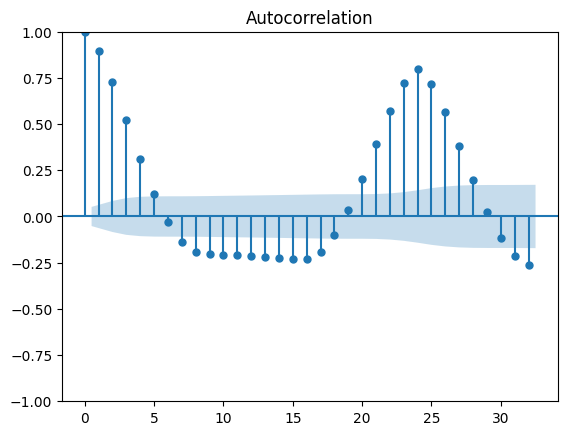

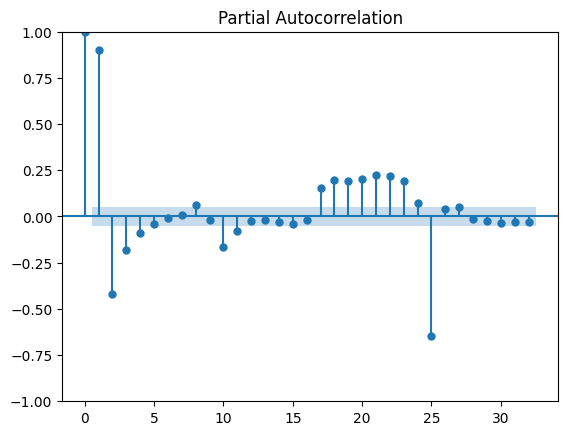

In [ ]:
plot_acf(df_9_train['usage']);
plot_pacf(df_9_train['usage']);

Training time: 0.032460927963256836
Prediction time: 0.060647010803222656
Root Mean Squared Error: 107.6009106679597
Test Data Std: 197.15611407329294
Test Data Mean: 544.5478260869565


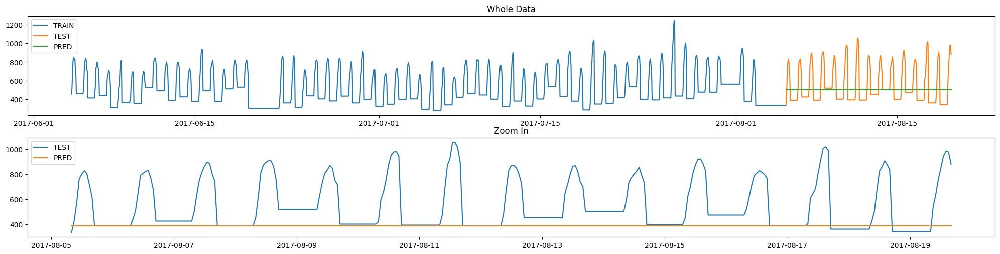

In [161]:
#TRAIN
model_9_ARIMA = ARIMA(df_9_train['usage'], order=(2,0,5))
t0 = time.time()
results_9_ARIMA = model_9_ARIMA.fit()
model_9_ARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_9_ARIMA_preds = results_9_ARIMA.predict(train_size,train_size+pred_size-1)
model_9_ARIMA_pred_time = time.time()-t0

#EVALUATION
model_9_ARIMA_RMSE = rmse(df_9_test['usage'],model_9_ARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_9_ES_train_time)
print("Prediction time:", model_9_ES_pred_time)
print("Root Mean Squared Error:", model_9_ES_RMSE)
print("Test Data Std:", df_9_test_std)
print("Test Data Mean:", df_9_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_9['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_9_test['usage'],label="TEST")
axs[0].plot(model_9_ARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_9_test['usage'],label="TEST")
axs[1].plot(model_2_ARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

### SARIMA

Municipality 0

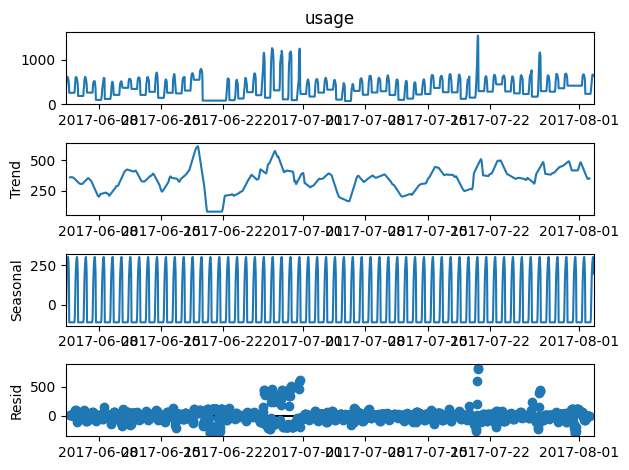

In [29]:
sd_0 = seasonal_decompose(df_0_train['usage'])
sd_0.plot();

In [53]:
adf_test(sd_0.seasonal,'Municipality 0')

Augmented Dickey-Fuller Test: Municipality 0
ADF test statistic     -4.476434e+15
p-value                 0.000000e+00
# lags used             2.400000e+01
# observations          1.401000e+03
critical value (1%)    -3.435026e+00
critical value (5%)    -2.863605e+00
critical value (10%)   -2.567870e+00
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


Training time: 30.55538773536682
Prediction time: 0.03133344650268555
Root Mean Squared Error: 349.373722186005
Test Data Std: 313.2117883606052
Test Data Mean: 557.4347826086956


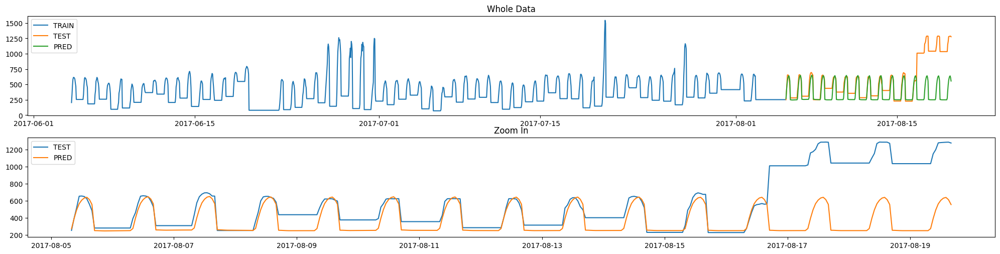

In [113]:
#TRAIN
model_0_SARIMA = SARIMAX(df_0_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_0_SARIMA = model_0_SARIMA.fit(maxiter=200)
model_0_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_0_SARIMA_preds = results_0_SARIMA.predict(train_size,train_size+pred_size-1)
model_0_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_0_SARIMA_RMSE = rmse(df_0_test['usage'],model_0_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_0_SARIMA_train_time)
print("Prediction time:", model_0_SARIMA_pred_time)
print("Root Mean Squared Error:", model_0_SARIMA_RMSE)
print("Test Data Std:", df_0_test_std)
print("Test Data Mean:", df_0_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_0['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_0_test['usage'],label="TEST")
axs[0].plot(model_0_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_0_test['usage'],label="TEST")
axs[1].plot(model_0_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 1

Training time: 60.22386860847473
Prediction time: 0.03636002540588379
Root Mean Squared Error: 42.59472084126401
Test Data Std: 99.4846107811236
Test Data Mean: 252.13623188405796


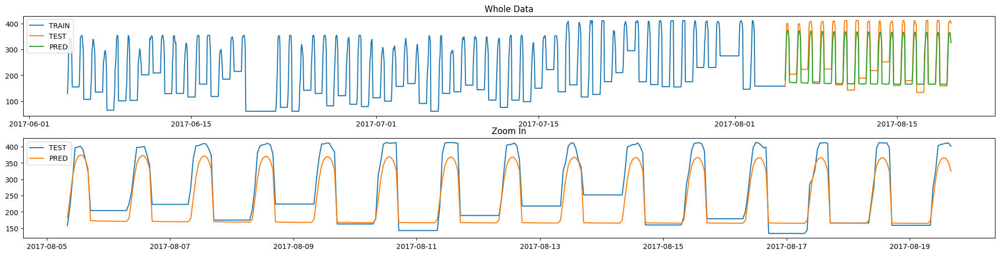

In [114]:
#TRAIN
model_1_SARIMA = SARIMAX(df_1_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_1_SARIMA = model_1_SARIMA.fit(maxiter=200)
model_1_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_1_SARIMA_preds = results_1_SARIMA.predict(train_size,train_size+pred_size-1)
model_1_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_1_SARIMA_RMSE = rmse(df_1_test['usage'],model_1_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_1_SARIMA_train_time)
print("Prediction time:", model_1_SARIMA_pred_time)
print("Root Mean Squared Error:", model_1_SARIMA_RMSE)
print("Test Data Std:", df_1_test_std)
print("Test Data Mean:", df_1_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_1['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_1_test['usage'],label="TEST")
axs[0].plot(model_1_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_1_test['usage'],label="TEST")
axs[1].plot(model_1_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 2

Training time: 46.025808811187744
Prediction time: 0.0471339225769043
Root Mean Squared Error: 185.3760612771751
Test Data Std: 126.07849668863679
Test Data Mean: 415.94202898550725


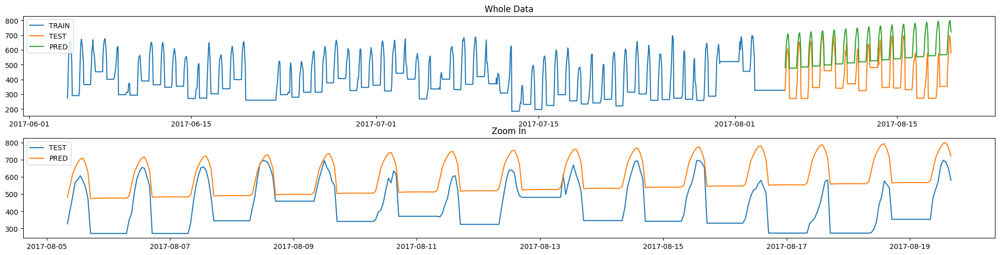

In [115]:
#TRAIN
model_2_SARIMA = SARIMAX(df_2_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_2_SARIMA = model_2_SARIMA.fit(maxiter=200)
model_2_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_2_SARIMA_preds = results_2_SARIMA.predict(train_size,train_size+pred_size-1)
model_2_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_2_SARIMA_RMSE = rmse(df_2_test['usage'],model_2_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_2_SARIMA_train_time)
print("Prediction time:", model_2_SARIMA_pred_time)
print("Root Mean Squared Error:", model_2_SARIMA_RMSE)
print("Test Data Std:", df_2_test_std)
print("Test Data Mean:", df_2_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_2['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_2_test['usage'],label="TEST")
axs[0].plot(model_2_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_2_test['usage'],label="TEST")
axs[1].plot(model_2_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 3

Training time: 11.028334140777588
Prediction time: 0.04778861999511719
Root Mean Squared Error: 243.27489526939397
Test Data Std: 382.31314351380087
Test Data Mean: 840.8202898550725


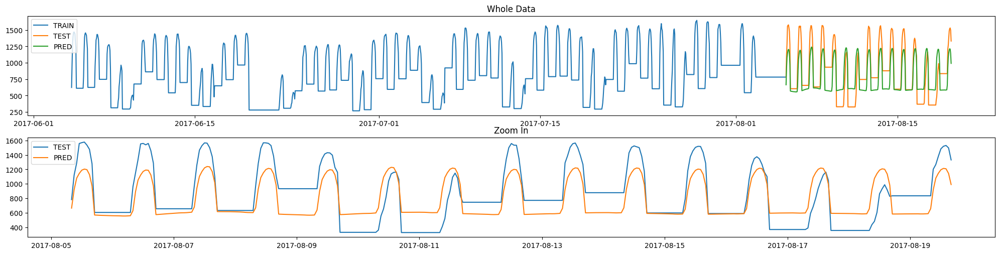

In [116]:
#TRAIN
model_3_SARIMA = SARIMAX(df_3_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_3_SARIMA = model_3_SARIMA.fit(maxiter=200)
model_3_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_3_SARIMA_preds = results_3_SARIMA.predict(train_size,train_size+pred_size-1)
model_3_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_3_SARIMA_RMSE = rmse(df_3_test['usage'],model_3_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_3_SARIMA_train_time)
print("Prediction time:", model_3_SARIMA_pred_time)
print("Root Mean Squared Error:", model_3_SARIMA_RMSE)
print("Test Data Std:", df_3_test_std)
print("Test Data Mean:", df_3_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_3['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_3_test['usage'],label="TEST")
axs[0].plot(model_3_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_3_test['usage'],label="TEST")
axs[1].plot(model_3_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 4

Training time: 22.040302753448486
Prediction time: 0.09509706497192383
Root Mean Squared Error: 591.9053134877402
Test Data Std: 824.8425395587469
Test Data Mean: 1881.7652173913043


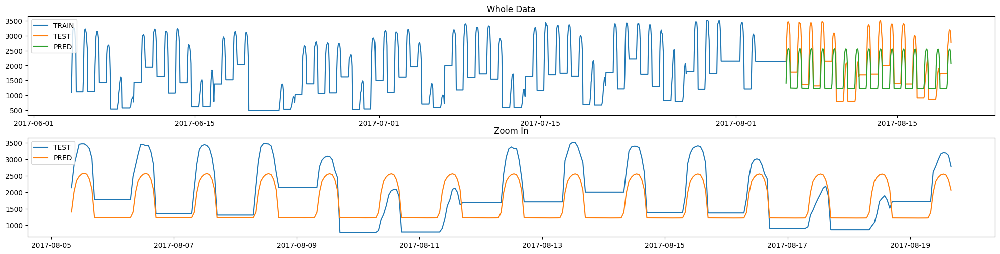

In [117]:
#TRAIN
model_4_SARIMA = SARIMAX(df_4_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_4_SARIMA = model_4_SARIMA.fit(maxiter=200)
model_4_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_4_SARIMA_preds = results_4_SARIMA.predict(train_size,train_size+pred_size-1)
model_4_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_4_SARIMA_RMSE = rmse(df_4_test['usage'],model_4_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_4_SARIMA_train_time)
print("Prediction time:", model_4_SARIMA_pred_time)
print("Root Mean Squared Error:", model_4_SARIMA_RMSE)
print("Test Data Std:", df_4_test_std)
print("Test Data Mean:", df_4_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_4['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_4_test['usage'],label="TEST")
axs[0].plot(model_4_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_4_test['usage'],label="TEST")
axs[1].plot(model_4_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 5

Training time: 28.512197256088257
Prediction time: 0.036730289459228516
Root Mean Squared Error: 48.54561078959985
Test Data Std: 100.76893299236936
Test Data Mean: 83.36521739130434


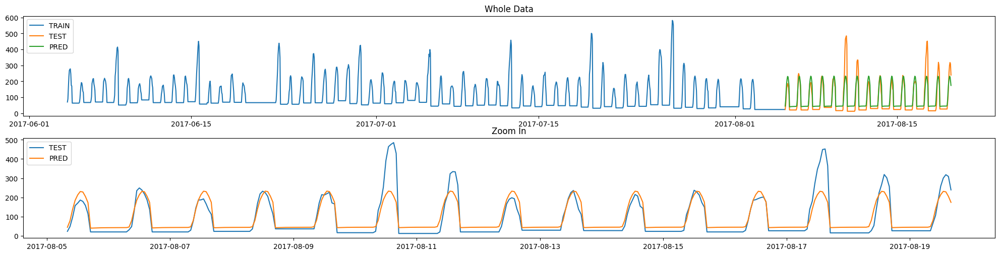

In [118]:
#TRAIN
model_5_SARIMA = SARIMAX(df_5_train['usage'], order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_5_SARIMA = model_5_SARIMA.fit(maxiter=200)
model_5_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_5_SARIMA_preds = results_5_SARIMA.predict(train_size,train_size+pred_size-1)
model_5_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_5_SARIMA_RMSE = rmse(df_5_test['usage'],model_5_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_5_SARIMA_train_time)
print("Prediction time:", model_5_SARIMA_pred_time)
print("Root Mean Squared Error:", model_5_SARIMA_RMSE)
print("Test Data Std:", df_5_test_std)
print("Test Data Mean:", df_5_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_5['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_5_test['usage'],label="TEST")
axs[0].plot(model_5_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_5_test['usage'],label="TEST")
axs[1].plot(model_5_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 6

Training time: 69.80508184432983
Prediction time: 0.03790926933288574
Root Mean Squared Error: 347.4375171198883
Test Data Std: 334.3384319939754
Test Data Mean: 947.2260869565217


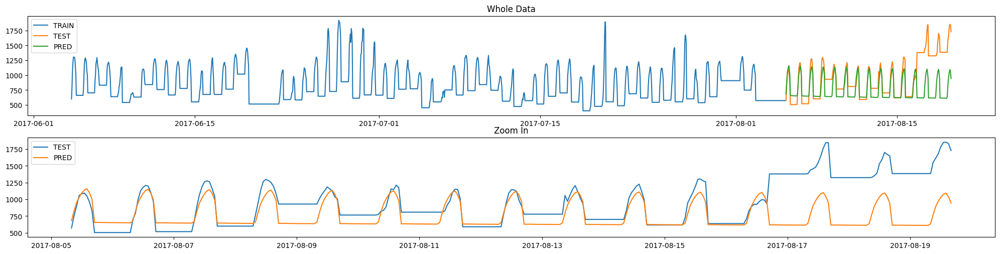

In [119]:
#TRAIN
model_6_SARIMA = SARIMAX(df_6_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_6_SARIMA = model_6_SARIMA.fit(maxiter=200)
model_6_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_6_SARIMA_preds = results_6_SARIMA.predict(train_size,train_size+pred_size-1)
model_6_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_6_SARIMA_RMSE = rmse(df_6_test['usage'],model_6_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_6_SARIMA_train_time)
print("Prediction time:", model_6_SARIMA_pred_time)
print("Root Mean Squared Error:", model_6_SARIMA_RMSE)
print("Test Data Std:", df_6_test_std)
print("Test Data Mean:", df_6_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_6['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_6_test['usage'],label="TEST")
axs[0].plot(model_6_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_6_test['usage'],label="TEST")
axs[1].plot(model_6_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 7

Training time: 23.319013833999634
Prediction time: 0.037604570388793945
Root Mean Squared Error: 123.37585389428497
Test Data Std: 313.7489177950954
Test Data Mean: 950.9826086956522


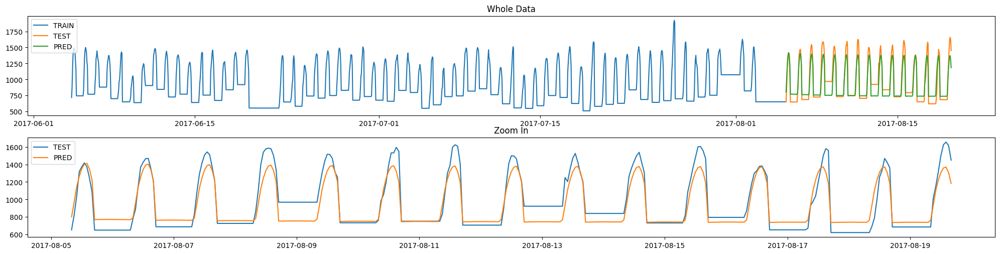

In [120]:
#TRAIN
model_7_SARIMA = SARIMAX(df_7_train['usage'], order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_7_SARIMA = model_7_SARIMA.fit(maxiter=200)
model_7_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_7_SARIMA_preds = results_7_SARIMA.predict(train_size,train_size+pred_size-1)
model_7_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_7_SARIMA_RMSE = rmse(df_7_test['usage'],model_7_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_7_SARIMA_train_time)
print("Prediction time:", model_7_SARIMA_pred_time)
print("Root Mean Squared Error:", model_7_SARIMA_RMSE)
print("Test Data Std:", df_7_test_std)
print("Test Data Mean:", df_7_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_7['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_7_test['usage'],label="TEST")
axs[0].plot(model_7_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_7_test['usage'],label="TEST")
axs[1].plot(model_7_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 8

Training time: 58.811604738235474
Prediction time: 0.04780912399291992
Root Mean Squared Error: 157.46182814136316
Test Data Std: 300.19868204639573
Test Data Mean: 784.5449275362319


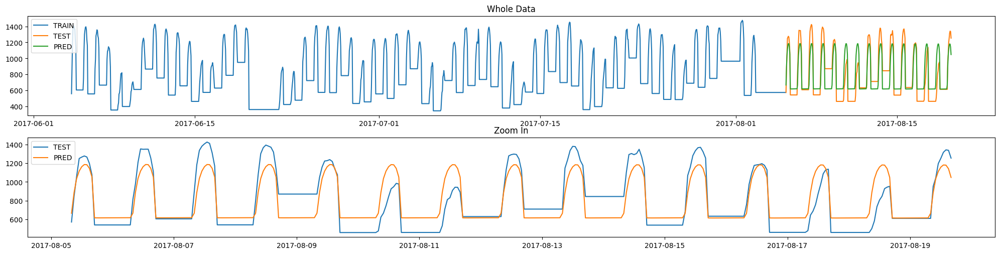

In [121]:
#TRAIN
model_8_SARIMA = SARIMAX(df_8_train['usage'], order=(2,0,6),seasonal_order=(1,0,1,24))
t0 = time.time()
results_8_SARIMA = model_8_SARIMA.fit(maxiter=200)
model_8_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_8_SARIMA_preds = results_8_SARIMA.predict(train_size,train_size+pred_size-1)
model_8_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_8_SARIMA_RMSE = rmse(df_8_test['usage'],model_8_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_8_SARIMA_train_time)
print("Prediction time:", model_8_SARIMA_pred_time)
print("Root Mean Squared Error:", model_8_SARIMA_RMSE)
print("Test Data Std:", df_8_test_std)
print("Test Data Mean:", df_8_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_8['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_8_test['usage'],label="TEST")
axs[0].plot(model_8_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_8_test['usage'],label="TEST")
axs[1].plot(model_8_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 9

Training time: 27.717859029769897
Prediction time: 0.03593325614929199
Root Mean Squared Error: 76.31153110380468
Test Data Std: 197.15611407329294
Test Data Mean: 544.5478260869565


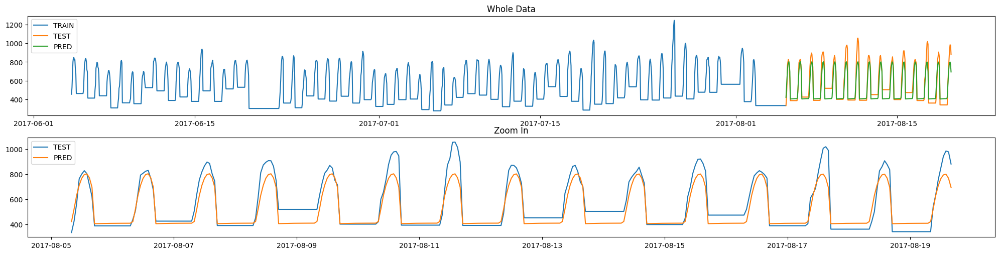

In [122]:
#TRAIN
model_9_SARIMA = SARIMAX(df_9_train['usage'], order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_9_SARIMA = model_9_SARIMA.fit(maxiter=200)
model_9_SARIMA_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_9_SARIMA_preds = results_9_SARIMA.predict(train_size,train_size+pred_size-1)
model_9_SARIMA_pred_time = time.time()-t0

#EVALUATION
model_9_SARIMA_RMSE = rmse(df_9_test['usage'],model_9_SARIMA_preds[-test_size:])

#PRINT
print("Training time:", model_9_SARIMA_train_time)
print("Prediction time:", model_9_SARIMA_pred_time)
print("Root Mean Squared Error:", model_9_SARIMA_RMSE)
print("Test Data Std:", df_9_test_std)
print("Test Data Mean:", df_9_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_9['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_9_test['usage'],label="TEST")
axs[0].plot(model_9_SARIMA_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_9_test['usage'],label="TEST")
axs[1].plot(model_9_SARIMA_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

### SARIMAX

Municipality 0

Training time: 47.761364698410034
Prediction time: 0.040490150451660156
Root Mean Squared Error: 364.59769039637723
Test Data Std: 313.2117883606052
Test Data Mean: 557.4347826086956


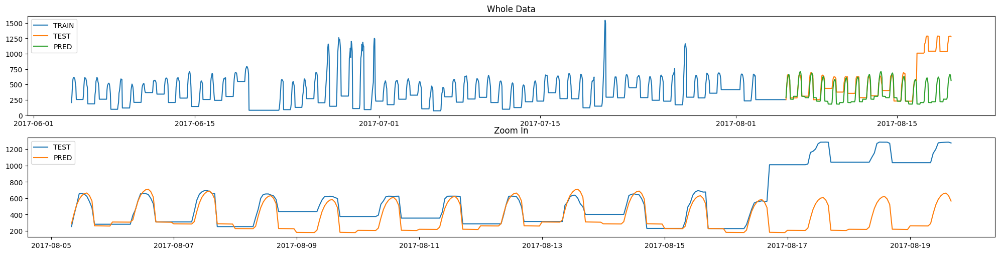

In [88]:
#TRAIN
model_0_SARIMAX = SARIMAX(df_0_train['usage'], exog=df_0_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_0_SARIMAX = model_0_SARIMAX.fit(maxiter=400)
model_0_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_0_SARIMAX_preds = results_0_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_0[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_0_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_0_SARIMAX_RMSE = rmse(df_0_test['usage'],model_0_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_0_SARIMAX_train_time)
print("Prediction time:", model_0_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_0_SARIMAX_RMSE)
print("Test Data Std:", df_0_test_std)
print("Test Data Mean:", df_0_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_0['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_0_test['usage'],label="TEST")
axs[0].plot(model_0_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_0_test['usage'],label="TEST")
axs[1].plot(model_0_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 1

Training time: 92.97108793258667
Prediction time: 0.09196209907531738
Root Mean Squared Error: 43.715132997358765
Test Data Std: 99.4846107811236
Test Data Mean: 252.13623188405796


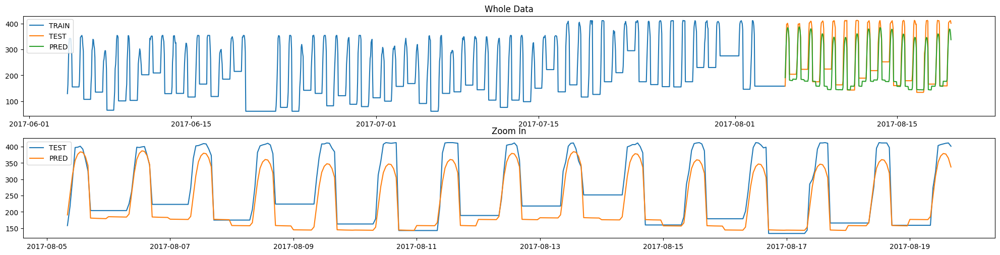

In [89]:
#TRAIN
model_1_SARIMAX = SARIMAX(df_1_train['usage'], exog=df_1_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_1_SARIMAX = model_1_SARIMAX.fit(maxiter=400)
model_1_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_1_SARIMAX_preds = results_1_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_1[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_1_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_1_SARIMAX_RMSE = rmse(df_1_test['usage'],model_1_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_1_SARIMAX_train_time)
print("Prediction time:", model_1_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_1_SARIMAX_RMSE)
print("Test Data Std:", df_1_test_std)
print("Test Data Mean:", df_1_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_1['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_1_test['usage'],label="TEST")
axs[0].plot(model_1_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_1_test['usage'],label="TEST")
axs[1].plot(model_1_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 2

Training time: 351.7668673992157
Prediction time: 0.09511637687683105
Root Mean Squared Error: 69.52056990413624
Test Data Std: 126.07849668863679
Test Data Mean: 415.94202898550725


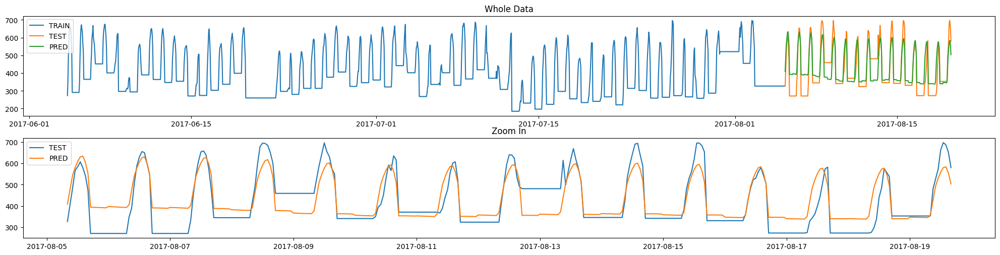

In [90]:
#TRAIN
model_2_SARIMAX = SARIMAX(df_2_train['usage'], exog=df_2_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_2_SARIMAX = model_2_SARIMAX.fit(maxiter=400)
model_2_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_2_SARIMAX_preds = results_2_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_2[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_2_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_2_SARIMAX_RMSE = rmse(df_2_test['usage'],model_2_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_2_SARIMAX_train_time)
print("Prediction time:", model_2_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_2_SARIMAX_RMSE)
print("Test Data Std:", df_2_test_std)
print("Test Data Mean:", df_2_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_2['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_2_test['usage'],label="TEST")
axs[0].plot(model_2_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_2_test['usage'],label="TEST")
axs[1].plot(model_2_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 3

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Training time: 114.92922711372375
Prediction time: 0.027209758758544922
Root Mean Squared Error: 196.7196280148984
Test Data Std: 382.31314351380087
Test Data Mean: 840.8202898550725


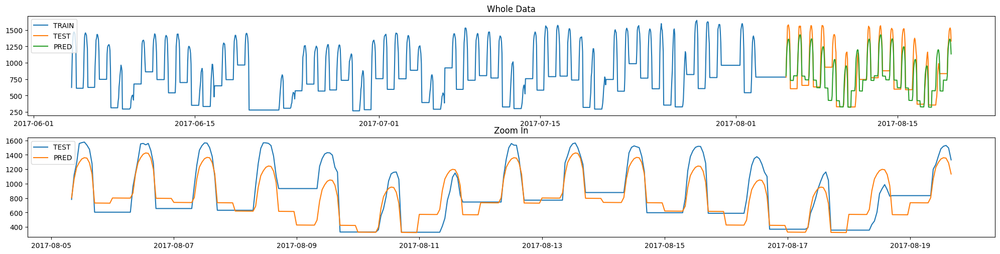

In [91]:
#TRAIN
model_3_SARIMAX = SARIMAX(df_3_train['usage'], exog=df_3_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_3_SARIMAX = model_3_SARIMAX.fit(maxiter=400)
model_3_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_3_SARIMAX_preds = results_3_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_3[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_3_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_3_SARIMAX_RMSE = rmse(df_3_test['usage'],model_3_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_3_SARIMAX_train_time)
print("Prediction time:", model_3_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_3_SARIMAX_RMSE)
print("Test Data Std:", df_3_test_std)
print("Test Data Mean:", df_3_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_3['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_3_test['usage'],label="TEST")
axs[0].plot(model_3_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_3_test['usage'],label="TEST")
axs[1].plot(model_3_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 4

Training time: 105.45839214324951
Prediction time: 0.027991533279418945
Root Mean Squared Error: 486.71628466672394
Test Data Std: 824.8425395587469
Test Data Mean: 1881.7652173913043


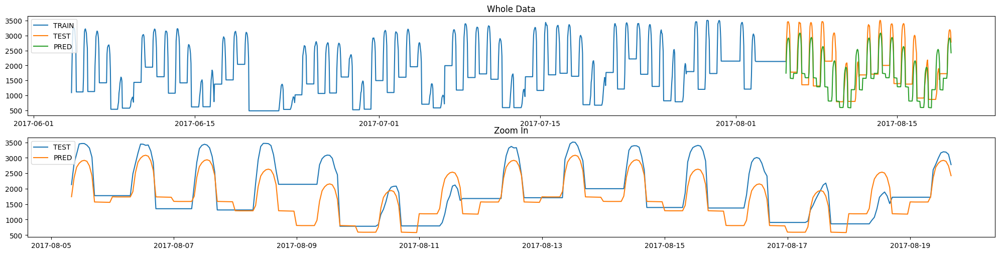

In [92]:
#TRAIN
model_4_SARIMAX = SARIMAX(df_4_train['usage'], exog=df_4_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_4_SARIMAX = model_4_SARIMAX.fit(maxiter=400)
model_4_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_4_SARIMAX_preds = results_4_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_4[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_4_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_4_SARIMAX_RMSE = rmse(df_4_test['usage'],model_4_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_4_SARIMAX_train_time)
print("Prediction time:", model_4_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_4_SARIMAX_RMSE)
print("Test Data Std:", df_4_test_std)
print("Test Data Mean:", df_4_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_4['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_4_test['usage'],label="TEST")
axs[0].plot(model_4_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_4_test['usage'],label="TEST")
axs[1].plot(model_4_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 5

Training time: 64.37726402282715
Prediction time: 0.08908939361572266
Root Mean Squared Error: 50.083895056981575
Test Data Std: 100.76893299236936
Test Data Mean: 83.36521739130434


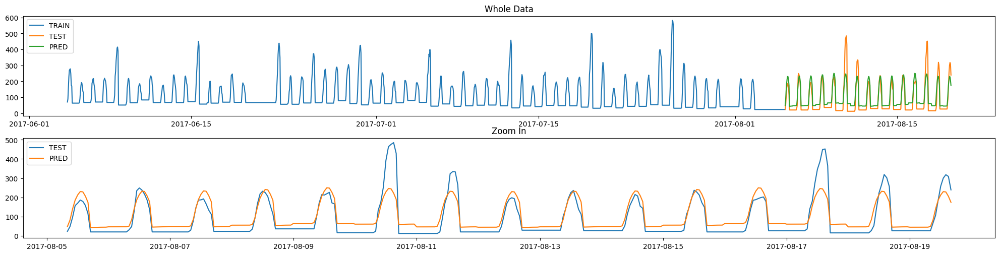

In [94]:
#TRAIN
model_5_SARIMAX = SARIMAX(df_5_train['usage'], exog=df_5_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,4),seasonal_order=(1,0,1,24))
t0 = time.time()
results_5_SARIMAX = model_5_SARIMAX.fit(maxiter=400)
model_5_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_5_SARIMAX_preds = results_5_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_5[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_5_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_5_SARIMAX_RMSE = rmse(df_5_test['usage'],model_5_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_5_SARIMAX_train_time)
print("Prediction time:", model_5_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_5_SARIMAX_RMSE)
print("Test Data Std:", df_5_test_std)
print("Test Data Mean:", df_5_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_5['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_5_test['usage'],label="TEST")
axs[0].plot(model_5_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_5_test['usage'],label="TEST")
axs[1].plot(model_5_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 6

Training time: 40.70084524154663
Prediction time: 0.08777403831481934
Root Mean Squared Error: 353.41188726967727
Test Data Std: 334.3384319939754
Test Data Mean: 947.2260869565217


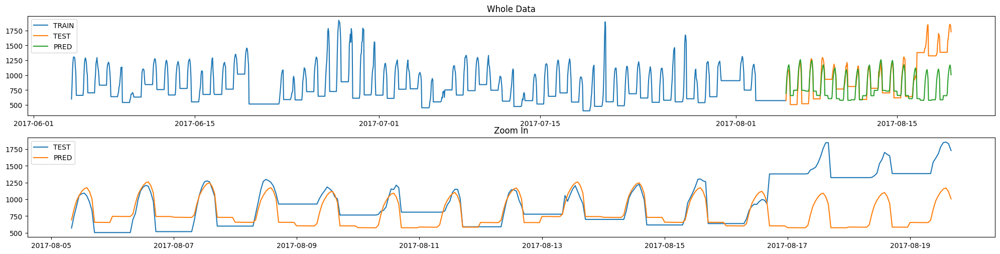

In [95]:
#TRAIN
model_6_SARIMAX = SARIMAX(df_6_train['usage'], exog=df_6_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_6_SARIMAX = model_6_SARIMAX.fit(maxiter=400)
model_6_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_6_SARIMAX_preds = results_6_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_6[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_6_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_6_SARIMAX_RMSE = rmse(df_6_test['usage'],model_6_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_6_SARIMAX_train_time)
print("Prediction time:", model_6_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_6_SARIMAX_RMSE)
print("Test Data Std:", df_6_test_std)
print("Test Data Mean:", df_6_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_6['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_6_test['usage'],label="TEST")
axs[0].plot(model_6_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_6_test['usage'],label="TEST")
axs[1].plot(model_6_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 7

Training time: 96.04577374458313
Prediction time: 0.04049086570739746
Root Mean Squared Error: 140.61800114415158
Test Data Std: 313.7489177950954
Test Data Mean: 950.9826086956522


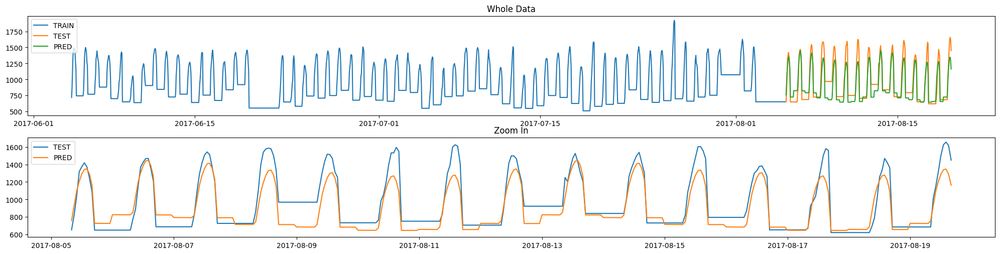

In [97]:
#TRAIN
model_7_SARIMAX = SARIMAX(df_7_train['usage'], exog=df_7_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,4),seasonal_order=(1,0,1,24))
t0 = time.time()
results_7_SARIMAX = model_7_SARIMAX.fit(maxiter=400)
model_7_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_7_SARIMAX_preds = results_7_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_7[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_7_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_7_SARIMAX_RMSE = rmse(df_7_test['usage'],model_7_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_7_SARIMAX_train_time)
print("Prediction time:", model_7_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_7_SARIMAX_RMSE)
print("Test Data Std:", df_7_test_std)
print("Test Data Mean:", df_7_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_7['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_7_test['usage'],label="TEST")
axs[0].plot(model_7_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_7_test['usage'],label="TEST")
axs[1].plot(model_7_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 8

Training time: 115.35996627807617
Prediction time: 0.028781414031982422
Root Mean Squared Error: 145.4250515056851
Test Data Std: 300.19868204639573
Test Data Mean: 784.5449275362319


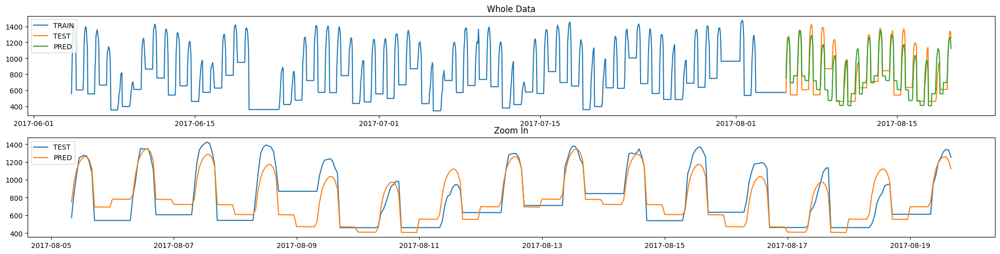

In [98]:
#TRAIN
model_8_SARIMAX = SARIMAX(df_8_train['usage'], exog=df_8_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_8_SARIMAX = model_8_SARIMAX.fit(maxiter=400)
model_8_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_8_SARIMAX_preds = results_8_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_8[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_8_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_8_SARIMAX_RMSE = rmse(df_8_test['usage'],model_8_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_8_SARIMAX_train_time)
print("Prediction time:", model_8_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_8_SARIMAX_RMSE)
print("Test Data Std:", df_8_test_std)
print("Test Data Mean:", df_8_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_8['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_8_test['usage'],label="TEST")
axs[0].plot(model_8_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_8_test['usage'],label="TEST")
axs[1].plot(model_8_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

Municipality 9

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Training time: 218.63497710227966
Prediction time: 0.05511879920959473
Root Mean Squared Error: 99.27233653935404
Test Data Std: 197.15611407329294
Test Data Mean: 544.5478260869565


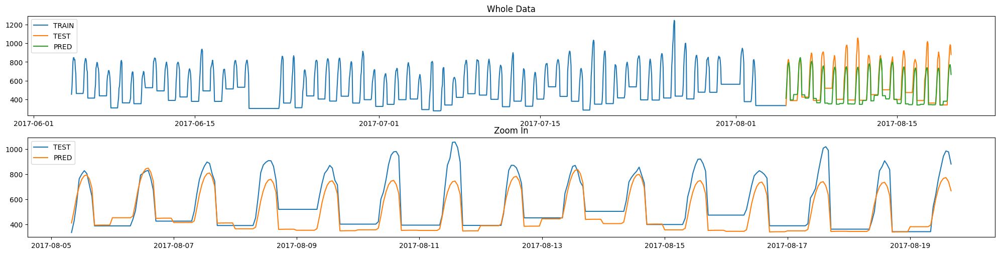

In [99]:
#TRAIN
model_9_SARIMAX = SARIMAX(df_9_train['usage'], exog=df_9_train[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']],
                          order=(2,0,5),seasonal_order=(1,0,1,24))
t0 = time.time()
results_9_SARIMAX = model_9_SARIMAX.fit(maxiter=400)
model_9_SARIMAX_train_time = time.time()-t0

#PREDICTION
t0 = time.time()
model_9_SARIMAX_preds = results_9_SARIMAX.predict(train_size,train_size+pred_size-1,
                                                  exog=df_9[train_size:][['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']])
model_9_SARIMAX_pred_time = time.time()-t0

#EVALUATION
model_9_SARIMAX_RMSE = rmse(df_9_test['usage'],model_9_SARIMAX_preds[-test_size:])

#PRINT
print("Training time:", model_9_SARIMAX_train_time)
print("Prediction time:", model_9_SARIMAX_pred_time)
print("Root Mean Squared Error:", model_9_SARIMAX_RMSE)
print("Test Data Std:", df_9_test_std)
print("Test Data Mean:", df_9_test_mean)

#PLOT
fig, axs = plt.subplots(2,figsize=(20, 5))
fig.tight_layout()
axs[0].title.set_text('Whole Data')
axs[0].plot(df_9['usage'][:-test_size],label="TRAIN")
axs[0].plot(df_9_test['usage'],label="TEST")
axs[0].plot(model_9_SARIMAX_preds[-test_size:],label="PRED")
axs[0].legend(loc='upper left')

axs[1].title.set_text('Zoom In')
axs[1].plot(df_9_test['usage'],label="TEST")
axs[1].plot(model_9_SARIMAX_preds[-test_size:],label="PRED")
axs[1].legend(loc='upper left')

### FINAL REPORT

[]

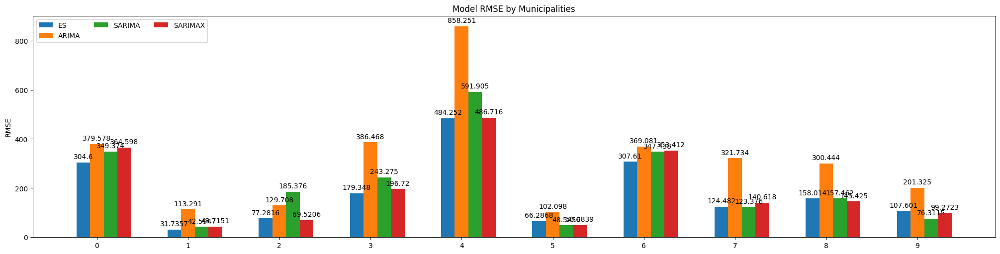

In [151]:
Municipalities = ('0', '1', '2', '3', '4', '5', '6', '7', '8' ,'9')
Models = {
    'ES': (model_0_ES_RMSE,model_1_ES_RMSE,model_2_ES_RMSE,model_3_ES_RMSE,model_4_ES_RMSE,model_5_ES_RMSE,model_6_ES_RMSE,model_7_ES_RMSE,model_8_ES_RMSE,model_9_ES_RMSE),
    'ARIMA': (model_0_ARIMA_RMSE,model_1_ARIMA_RMSE,model_2_ARIMA_RMSE,model_3_ARIMA_RMSE,model_4_ARIMA_RMSE,model_5_ARIMA_RMSE,
              model_6_ARIMA_RMSE,model_7_ARIMA_RMSE,model_8_ARIMA_RMSE,model_9_ARIMA_RMSE),
    'SARIMA': (model_0_SARIMA_RMSE,model_1_SARIMA_RMSE,model_2_SARIMA_RMSE,model_3_SARIMA_RMSE,model_4_SARIMA_RMSE,model_5_SARIMA_RMSE,
               model_6_SARIMA_RMSE,model_7_SARIMA_RMSE,model_8_SARIMA_RMSE,model_9_SARIMA_RMSE),
    'SARIMAX': (model_0_SARIMAX_RMSE,model_1_SARIMAX_RMSE,model_2_SARIMAX_RMSE,model_3_SARIMAX_RMSE,model_4_SARIMAX_RMSE,model_5_SARIMAX_RMSE,
                model_6_SARIMAX_RMSE,model_7_SARIMAX_RMSE,model_8_SARIMAX_RMSE,model_9_SARIMAX_RMSE),
}

x = np.arange(len(Municipalities))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained',figsize=(20, 5))

for attribute, measurement in Models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('RMSE')
ax.set_title("Model RMSE by Municipalities")
ax.set_xticks(x + width, Municipalities)
ax.legend(loc='upper left', ncols=3)
#ax.set_ylim(0, 250)
#ax.autoscale(tight=True)

plt.plot()

[]

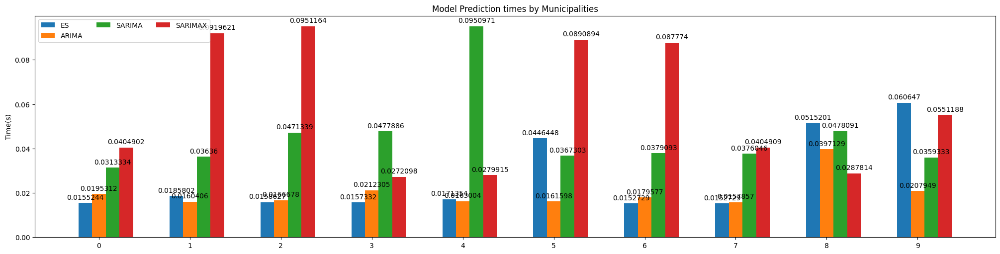

In [163]:
Municipalities = ('0', '1', '2', '3', '4', '5', '6', '7', '8' ,'9')
Models = {
    'ES': (model_0_ES_pred_time,model_1_ES_pred_time,model_2_ES_pred_time,model_3_ES_pred_time,model_4_ES_pred_time,
           model_5_ES_pred_time,model_6_ES_pred_time,model_6_ES_pred_time,model_8_ES_pred_time,model_9_ES_pred_time),
    'ARIMA': (model_0_ARIMA_pred_time,model_1_ARIMA_pred_time,model_2_ARIMA_pred_time,model_3_ARIMA_pred_time,model_4_ARIMA_pred_time,
              model_5_ARIMA_pred_time,model_6_ARIMA_pred_time,model_7_ARIMA_pred_time,model_8_ARIMA_pred_time,model_9_ARIMA_pred_time),
    'SARIMA': (model_0_SARIMA_pred_time,model_1_SARIMA_pred_time,model_2_SARIMA_pred_time,model_3_SARIMA_pred_time,model_4_SARIMA_pred_time,
               model_5_SARIMA_pred_time,model_6_SARIMA_pred_time,model_7_SARIMA_pred_time,model_8_SARIMA_pred_time,model_9_SARIMA_pred_time),
    'SARIMAX': (model_0_SARIMAX_pred_time,model_1_SARIMAX_pred_time,model_2_SARIMAX_pred_time,model_3_SARIMAX_pred_time,model_4_SARIMAX_pred_time,
                model_5_SARIMAX_pred_time,model_6_SARIMAX_pred_time,model_7_SARIMAX_pred_time,model_8_SARIMAX_pred_time,model_9_SARIMAX_pred_time),
}

x = np.arange(len(Municipalities))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained',figsize=(20, 5))

for attribute, measurement in Models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Time(s)')
ax.set_title("Model Prediction times by Municipalities")
ax.set_xticks(x + width, Municipalities)
ax.legend(loc='upper left', ncols=3)
#ax.set_ylim(0, 250)
#ax.autoscale(tight=True)

plt.plot()

[]

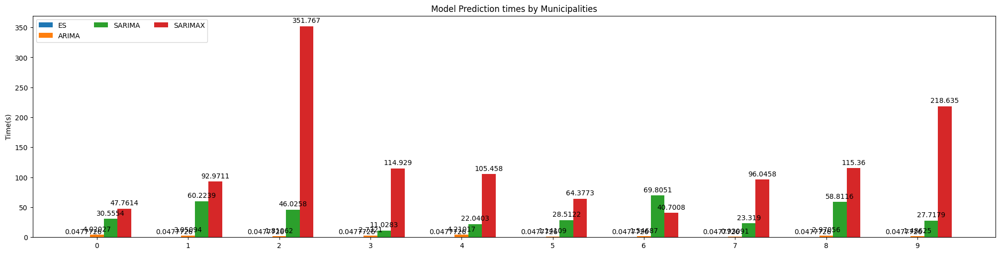

In [166]:
Municipalities = ('0', '1', '2', '3', '4', '5', '6', '7', '8' ,'9')
Models = {
    'ES': (model_0_ES_train_time,model_0_ES_train_time,model_0_ES_train_time,model_0_ES_train_time,model_0_ES_train_time,
           model_0_ES_train_time,model_0_ES_train_time,model_0_ES_train_time,model_0_ES_train_time,model_0_ES_train_time,),
    'ARIMA': (model_0_ARIMA_train_time,model_1_ARIMA_train_time,model_2_ARIMA_train_time,model_3_ARIMA_train_time,model_4_ARIMA_train_time,
              model_5_ARIMA_train_time,model_6_ARIMA_train_time,model_7_ARIMA_train_time,model_8_ARIMA_train_time,model_9_ARIMA_train_time,),
    'SARIMA': (model_0_SARIMA_train_time,model_1_SARIMA_train_time,model_2_SARIMA_train_time,model_3_SARIMA_train_time,model_4_SARIMA_train_time,
               model_5_SARIMA_train_time,model_6_SARIMA_train_time,model_7_SARIMA_train_time,model_8_SARIMA_train_time,model_9_SARIMA_train_time,),
    'SARIMAX': (model_0_SARIMAX_train_time,model_1_SARIMAX_train_time,model_2_SARIMAX_train_time,model_3_SARIMAX_train_time,model_4_SARIMAX_train_time,
                model_5_SARIMAX_train_time,model_6_SARIMAX_train_time,model_7_SARIMAX_train_time,model_8_SARIMAX_train_time,model_9_SARIMAX_train_time,),
}

x = np.arange(len(Municipalities))  # the label locations
width = 0.15  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained',figsize=(20, 5))

for attribute, measurement in Models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Time(s)')
ax.set_title("Model Prediction times by Municipalities")
ax.set_xticks(x + width, Municipalities)
ax.legend(loc='upper left', ncols=3)
#ax.set_ylim(0, 250)
#ax.autoscale(tight=True)

plt.plot()